# <span style="color: orange;">6. Modelling of data with RNN's</span>

In this notebook, we will explore and evaluate various RNN-based architectures for predicting negotiation outcomes. Our goal is to compare the performance of different RNN models, including:

- LSTM (Long Short-Term Memory)
- Standard RNN
- GRU (Gated Recurrent Unit)
- Elman RNN
- BI-LSTM

The Goal is to identify the best performing architecture for our dataset while testing the impact of two types of embedding:
- Pre Trained Word2Vec Embedding
- Self trained Word2Vec Embedding
- GloVe Embedding
- FastText Embedding



In [1]:
import time

start_time = time.time()

In [2]:
# Basic packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# For Text processing
import string
import re
import warnings
warnings.filterwarnings('ignore')

# Install and import nltk and upprade if necessary libraries
%pip install nltk
import nltk
%pip install --upgrade pandas
%pip install openpyxl --upgrade

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [3]:
df = pd.read_excel('cleansed_data.xlsx')
df.head()
df.isna().sum()
  

SenderID             0
ReceiverID           0
ActionType           0
NegoOutcome          0
Content              0
length               0
WordCount_basic      0
Content_Length       0
Sentence_Count       0
Word_Count_nltk      0
NegoOutcomeLabel     0
Sentiment            0
SentimentCategory    0
dtype: int64

First of all we will continue using our df_complete_cleansing dataset to ensure same data for our traditional and RNN Models to look which ones perform better.

In [4]:
df.head()

,SenderID,ReceiverID,ActionType,NegoOutcome,Content,length,WordCount_basic,Content_Length,Sentence_Count,Word_Count_nltk,NegoOutcomeLabel,Sentiment,SentimentCategory
0,70,69,Offer,FinalAccept,hope well management company agreed building f...,1635,219,1635,1,219,1,0.226814,Positive
1,69,70,Counteroffer,FinalAccept,reaching mei apologize slight delay getting ba...,1462,197,1462,1,197,1,0.156856,Positive
2,70,69,Counteroffer,FinalAccept,r kind response need hurry guess face daily fi...,1465,195,1465,1,195,1,0.219167,Positive
3,69,70,Counteroffer,FinalAccept,swift reply read second set proposal discussed...,1104,148,1104,1,148,1,0.139561,Positive
4,70,69,Counteroffer,FinalAccept,proposal effort far seems getting close resolv...,1153,154,1153,1,154,1,0.055179,Positive


## <span style="color: orange;">Word Embedding Pre-Trained Model</span>

In [5]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize

nego_message_data = df["Content"]
df_nego_message_data = pd.DataFrame(nego_message_data)

# Load punkt model
nltk.download('punkt')

# Tokenizing
df_nego_message_data['Tokenized_Content'] = df_nego_message_data['Content'].apply(word_tokenize)

# Converting
sentences = df_nego_message_data['Tokenized_Content'].tolist()
print(sentences)

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/tarkanyildirim/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


[['hope', 'well', 'management', 'company', 'agreed', 'building', 'fruitful', 'partnership', 'face', 'upcoming', 'disruption', 'market', 'best', 'innovation', 'green', 'spirit', 'would', 'like', 'introduce', 'nasa', 'nova', 'reaching', 'tighten', 'general', 'term', 'harm', 'ag', 'established', 'first', 'round', 'discussion', 'far', 'please', 'find', 'attached', 'proposal', 'open', 'issue', 'joint', 'venture', 'would', 'like', 'explain', 'following', 'director', 'first', 'would', 'like', 'address', 'unsolved', 'issue', 'number', 'director', 'sent', 'since', 'agreed', 'decisionmaking', 'committee', 'consisting', 'member', 'simple', 'majority', 'power', 'strongly', 'suggest', 'dividing', 'seat', 'svn', 'tech', 'would', 'able', 'deal', 'local', 'authority', 'partner', 'successfully', 'using', 'strong', 'local', 'network', 'relationship', 'engineer', 'develop', 'thorough', 'convenient', 'product', 'sharing', 'experience', 'side', 'inspiring', 'essential', 'thus', 'looking', 'forward', 'set',

In [6]:
# Load Word Embedding
nltk.download("word2vec_sample")
# %pip install gensim

import gensim
from nltk.data import find


[nltk_data] Downloading package word2vec_sample to
[nltk_data]     /Users/tarkanyildirim/nltk_data...
[nltk_data]   Package word2vec_sample is already up-to-date!


In [7]:
# Word2Vec-Sample-Model
word2vec_sample = str(find('models/word2vec_sample/pruned.word2vec.txt'))
pre_w2v_model = gensim.models.KeyedVectors.load_word2vec_format(word2vec_sample, binary=False)

# Modellinformation
print(f"Anzahl der Schlüssel im Modell: {len(pre_w2v_model.key_to_index)}")
print(f"Vektorgröße für 'negotiation': {len(pre_w2v_model['negotiation'])}")

print(pre_w2v_model.most_similar(positive=["negotiation"], topn=20))
print(pre_w2v_model.most_similar(positive=["negotiation"], negative=["agreement"], topn=10))

print(pre_w2v_model["negotiation"])

Anzahl der Schlüssel im Modell: 43981
Vektorgröße für 'negotiation': 300
[('negotiations', 0.816856861114502), ('negotiating', 0.7531847357749939), ('bargaining', 0.6434566378593445), ('negotiate', 0.6341554522514343), ('negotiated', 0.6292652487754822), ('talks', 0.6133744716644287), ('discussions', 0.6095365881919861), ('dialogue', 0.5417248606681824), ('haggling', 0.5341888070106506), ('agreement', 0.501986026763916), ('impasse', 0.4880932867527008), ('consultations', 0.4769951105117798), ('discussion', 0.465476393699646), ('compromise', 0.454706072807312), ('Discussions', 0.4485512673854828), ('brinkmanship', 0.44761836528778076), ('agreements', 0.4455186724662781), ('ratification', 0.4414721429347992), ('preconditions', 0.435526579618454), ('tripartite', 0.4344906210899353)]
[('diplomacy', 0.323906272649765), ('dialogue', 0.29187703132629395), ('Interviewing', 0.28622379899024963), ('politicking', 0.28376880288124084), ('tactful', 0.2724672555923462), ('debates', 0.272152364253997

## <span style="color: orange;">LSTM</span>

LSTMs are ideal for tasks requiring long-term dependencies due to their gating mechanisms, which effectively mitigate the vanishing gradient problem. As highlighted in the paper *"Recent Advances in Recurrent Neural Networks"*, LSTMs excel in applications such as machine translation and speech recognition, where understanding context over longer sequences is critical (Salehinejad et al., 2018).

To enhance the accuracy and efficiency of predicting negotiation outcomes, we utilize **pre-trained Word2Vec embeddings**. These embeddings offer several advantages:

1. **Pre-trained Knowledge**: Rich semantic information about words is already captured, reducing the need to train embeddings from scratch, particularly useful with smaller datasets.
2. **Consistency and Efficiency**: Pre-trained vectors ensure uniform representation of words, significantly accelerating training.
3. **Improved Performance**: The embeddings capture relationships and context, enabling the model to better understand negotiation-related text.
4. **Ease of Integration**: By creating an embedding matrix that maps word indices to their respective vectors, we provide a strong foundation for the model's embedding layer, enhancing its learning capabilities.

Reference: Salehinejad, H., Sankar, S., Barfett, J., Colak, E., & Valaee, S. (2018). Recent advances in recurrent neural networks. arXiv. https://arxiv.org/abs/1801.01078

In [8]:
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import tensorflow as tf
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, accuracy_score
from keras.regularizers import l2

In [9]:
sentences

[['hope',
  'well',
  'management',
  'company',
  'agreed',
  'building',
  'fruitful',
  'partnership',
  'face',
  'upcoming',
  'disruption',
  'market',
  'best',
  'innovation',
  'green',
  'spirit',
  'would',
  'like',
  'introduce',
  'nasa',
  'nova',
  'reaching',
  'tighten',
  'general',
  'term',
  'harm',
  'ag',
  'established',
  'first',
  'round',
  'discussion',
  'far',
  'please',
  'find',
  'attached',
  'proposal',
  'open',
  'issue',
  'joint',
  'venture',
  'would',
  'like',
  'explain',
  'following',
  'director',
  'first',
  'would',
  'like',
  'address',
  'unsolved',
  'issue',
  'number',
  'director',
  'sent',
  'since',
  'agreed',
  'decisionmaking',
  'committee',
  'consisting',
  'member',
  'simple',
  'majority',
  'power',
  'strongly',
  'suggest',
  'dividing',
  'seat',
  'svn',
  'tech',
  'would',
  'able',
  'deal',
  'local',
  'authority',
  'partner',
  'successfully',
  'using',
  'strong',
  'local',
  'network',
  'relationsh

In [10]:
#pre-trained Google pruned W2V
pre_w2v_model
# See how big the vocabulary is for the self-trained W2V model
vocab_size = len(pre_w2v_model.index_to_key)+1  # indextokey
embedding_dim = pre_w2v_model.vector_size
vocab_size, embedding_dim

(43982, 300)

In [11]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index
word_index
sequences = tokenizer.texts_to_sequences(sentences)
padded_sequences = pad_sequences(sequences, maxlen=10,padding='post') # LSTM needs fixed length sequences
padded_sequences
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in word_index.items():
    if word in pre_w2v_model:
        embedding_matrix[i] = pre_w2v_model[word]


embedding_matrix


array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.0469352 ,  0.0682227 ,  0.111824  , ..., -0.0800207 ,
         0.00290139, -0.0528342 ],
       [-0.109404  , -0.0117002 , -0.0405201 , ..., -0.00805338,
        -0.0145872 , -0.070505  ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

We start by loading the **pre-trained Word2Vec model** to leverage its high-dimensional word vectors. These embeddings capture semantic relationships, allowing the model to understand the context and meaning of words more effectively.

Next, we calculate the vocabulary size and the embedding dimensions. The vocabulary includes all unique words from the pre-trained model, with additional room for padding or unknown words. The embedding dimension reflects the size of each word vector, which will form the input space for our neural network.

In [12]:
#Create test and train split
from sklearn.model_selection import train_test_split

X_lstm = padded_sequences
y_lstm = df['NegoOutcomeLabel']

X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_lstm, y_lstm, test_size=0.3, random_state=42)

We are training an **LSTM model** to process sequential data while tackling two common challenges: **overfitting** and **class imbalance**.

To address these challenges:
- **Dropout layers** and **L2 regularization** are included to reduce overfitting and enhance the model's ability to generalize.
- A **trainable embedding layer**, initialized with pre-trained weights, provides a strong starting point while adapting to our task.

Additionally, the use of non-linear activation functions, such as the **sigmoid function**, enables the network to capture complex patterns within the data. Non-linearity is crucial as it allows the model to approximate a broader range of functions, enhancing its learning capability (*Salehinejad et al., 2018, p.2*).

**Reference:** Salehinejad, H., Sankar, S., Barfett, J., Colak, E., & Valaee, S. (2018). Recent advances in recurrent neural networks. arXiv. https://arxiv.org/abs/1801.01078

In [13]:
max_len =10  # max length of a sentence


# Embedding, LSTM, Dense
model_lstm = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True),  # Embeddings trainable
    LSTM(64, return_sequences=False, dropout=0.5, recurrent_dropout=0.5),
    Dropout(0.5),  # Dropout layer for regularization
    Dense(32, activation='relu', kernel_regularizer=l2(0.01)),  # Fully connected layer
    Dropout(0.5),  # Dropout layer for regularization
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))  # Binery classification
])

In [14]:
import tensorflow as tf

# Exponential decay for learning rate
initial_learning_rate = 5e-4
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam)
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_lstm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])


model_lstm.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ ?                      │    13,194,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,194,600 (50.33 MB)

 Trainable params: 13,194,600 (50.33 MB)

 Non-trainable params: 0 (0.00 B)

The code applies a **learning rate schedule with exponential decay**. The goal is to start with a moderate learning rate (`5e-4` as noted) and decay it gradually over time, ensuring stable and efficient updates.

The **AdamW optimizer** incorporates:
- A **learning rate decay schedule** (`decay_steps=1500`, `decay_rate=0.9`) for controlled updates, acknowledging the importance of slowing down updates as training progresses.
- Changes to `beta_1` and `beta_2`, as highlighted, for better responsiveness to noisy gradients and adaptive updates.

These configurations are designed to address common issues like overfitting and instability during training. This further step alligns with the strategy of stabilizing fine-tuning processes while preserving the integrity of the learned features.

In [15]:
# Train the LSTM model
history_lstm = model_lstm.fit(X_train_lstm, np.array(y_train_lstm), 
                            epochs=10, batch_size=32, validation_split = 0.4,
                            validation_data=(X_test_lstm, np.array(y_test_lstm))) #,class_weight=class_weights_dict"""class_weight=class_weights_dict"""

#early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
predictions = model_lstm.predict(X_test_lstm)
predictions
predictions.size
binary_predictions = (predictions > 0.5).astype(int) # convert the predictions to binary
print(binary_predictions)

from sklearn.metrics import classification_report, accuracy_score

# Calculate and print the accuracy score
accuracy = accuracy_score(y_test_lstm, binary_predictions)
print(f'Accuracy: {accuracy:.4f}')

#Calculate average weighted f1 score
f1 = classification_report(y_test_lstm, binary_predictions, output_dict=True)['weighted avg']['f1-score']
print(f'F1 Score: {f1:.4f}')

# Calcualting AOC ROC score 
from sklearn.metrics import roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

predicted_probabilities = predictions

# Calculate the ROC AUC score
roc_auc = roc_auc_score(y_test_lstm, predicted_probabilities)
print(f'ROC AUC Score: {roc_auc:.4f}')

# Create a DataFrame for the current RNN model results
results_lstm_pre = pd.DataFrame({
    'Model': ['LSTM Pre-trained'],
    'Accuracy': [accuracy],
    'F1 Score': [f1],
    'ROC AUC': [roc_auc],
})
from sklearn.metrics import classification_report

print(classification_report(y_test_lstm, binary_predictions))

# Generate the classification report
classification_report_dict = classification_report(y_test_lstm, binary_predictions, output_dict=True)

# Convert the classification report to a DataFrame
classification_report_df = pd.DataFrame(classification_report_dict).transpose()

classification_report_df
results_lstm_pre

Epoch 1/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6550 - loss: 1.1050 - val_accuracy: 0.6739 - val_loss: 0.9866
Epoch 2/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.7128 - loss: 0.9476 - val_accuracy: 0.6739 - val_loss: 0.8972
Epoch 3/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.7257 - loss: 0.8532 - val_accuracy: 0.6739 - val_loss: 0.8319
Epoch 4/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.6786 - loss: 0.8122 - val_accuracy: 0.6739 - val_loss: 0.7809
Epoch 5/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.6899 - loss: 0.7428 - val_accuracy: 0.6739 - val_loss: 0.7406
Epoch 6/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.6884 - loss: 0.6699 - val_accuracy: 0.6739 - val_loss: 0.7191
Epoch 7/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.7168 - loss: 0.6080 - val_accuracy: 0.6954 - val_loss: 0.7072
Epoch 8/10
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.7840 - loss: 0.5368 - val_accuracy: 0.6954 - v

,Model,Accuracy,F1 Score,ROC AUC
0,LSTM Pre-trained,0.685345,0.665147,0.63995


In [16]:
# Evaluate on training set
train_loss, train_accuracy = model_lstm.evaluate(X_train_lstm, np.array(y_train_lstm), verbose=0)

# Evaluate on test set
test_loss, test_accuracy = model_lstm.evaluate(X_test_lstm, np.array(y_test_lstm), verbose=0)

# Print training and test accuracy
print("LSTM Evaluation:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


LSTM Evaluation:
Training Accuracy: 0.8978
Test Accuracy: 0.6853


The results of our LSTM model using the pre-trained embeddings demonstrate both progress and persistent challenges. Despite several optimization efforts, including tuning and adjustments, the model exhibits clear signs of **overfitting**. The **accuracy score** is steady at **0.6810**, and the **F1 score** achieves **0.6637**, reflecting moderate performance.

However, the **class imbalance issue** remains evident, also like seen in the other Methods like XGboost. The model struggles to identify class `0` (f1 score: 0.42) but performs better with class `1` (f1-score: 0.78). This highlights the inherent bias towards the majority class (`1`) in the predictions.

While the training accuracy improves across epochs, as seen in the logs, the validation accuracy, and loss reduction slows, indicating limited generalizability. Addressing these challenges may require further regularization or alternative architectures, such as GRUs or transformers, to balance class predictions.

## <span style="color: orange;">RNN</span>

RNNs (Recurrent Neural Networks) are designed to handle sequential data by remembering past inputs, making them great for tasks like text or time-series analysis. However, they often struggle with long-term memory, leading to the development of improved versions like LSTMs and GRUs.

In [17]:
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense


In [18]:
X_rnn = padded_sequences
y_rnn = df['NegoOutcomeLabel']

X_train_rnn, X_test_rnn, y_train_rnn, y_test_rnn = train_test_split(X_rnn, y_rnn, test_size=0.3, random_state=42)

In [19]:
# Define RNN Model
model_rnn = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, weights=[embedding_matrix],
              input_length=max_len, trainable=True),
    SimpleRNN(64, return_sequences=False, dropout=0.4),
    Dropout(0.5),  # Dropout after RNN layer
    Dense(32, activation='relu',kernel_regularizer=l2(0.01)),
    Dropout(0.5),  # Dropout after dense layer
    Dense(1, activation='sigmoid',kernel_regularizer=l2(0.01))
])

In [20]:
# Compile the Model
adamw_optimizer = tf.keras.optimizers.AdamW(learning_rate=0.001, weight_decay=1e-5)
model_rnn.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])
model_rnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ ?                      │    13,194,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn (SimpleRNN)          │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,194,600 (50.33 MB)

 Trainable params: 13,194,600 (50.33 MB)

 Non-trainable params: 0 (0.00 B)

Here, we define and compile a **Simple RNN** model using the pre-trained embeddings as input. The architecture reflects a straightforward approach to sequence modeling, with a focus on capturing temporal dependencies:

- **Simple RNN Layer**: A recurrent layer with 64 units to process sequential data. Since it does not support both `dropout` and `recurrent_dropout` simultaneously, only `dropout` is applied to regulate overfitting.
- **Dense Layers**: Includes a fully connected layer with ReLU activation for feature extraction, followed by another dense layer for **binary classification** with a sigmoid activation function.

The model is compiled using the **AdamW optimizer**, which incorporates weight decay for regularization. The **binary cross-entropy loss function** is chosen for this classification task. This setup is designed to balance model complexity and generalization, addressing issues like overfitting and class imbalance. The architecture is intentionally simpler than LSTM or GRU models, making it an ideal baseline for comparison. 


In [21]:
from keras.callbacks import EarlyStopping

# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Metric to monitor (e.g., validation loss)
    patience=3,          # Number of epochs to wait for improvement
    restore_best_weights=True  # Restore the best weights after training
)


# Training the Model
history_rnn = model_rnn.fit(
    X_train_rnn, np.array(y_train_rnn),
    validation_data=(X_test_rnn, np.array(y_test_rnn)),
    epochs=100,
    batch_size=32,
    verbose=1,
    validation_split= 0.3,
    callbacks=[early_stopping]
)

Epoch 1/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.6642 - loss: 1.0684 - val_accuracy: 0.6739 - val_loss: 0.9585
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6866 - loss: 0.9210 - val_accuracy: 0.6753 - val_loss: 0.8613
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7241 - loss: 0.7828 - val_accuracy: 0.6537 - val_loss: 0.8006
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.8270 - loss: 0.6117 - val_accuracy: 0.6207 - val_loss: 0.8335
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9133 - loss: 0.4111 - val_accuracy: 0.6221 - val_loss: 0.9503
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9435 - loss: 0.3028 - val_accuracy: 0.6537 - val_loss: 1.0857


In [22]:
# Evaluating the Model
loss, accuracy = model_rnn.evaluate(X_test_rnn, np.array(y_test_rnn), verbose=1)
print(f"Test Accuracy: {accuracy:.4f}")

# Predictions and Report
predictions = model_rnn.predict(X_test_rnn)
binary_predictions_rnn = (predictions > 0.5).astype(int)

print(classification_report(y_test_rnn, binary_predictions_rnn))

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - accuracy: 0.6401 - loss: 0.8136
Test Accuracy: 0.6537
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
              precision    recall  f1-score   support

           0       0.43      0.19      0.27       227
           1       0.69      0.88      0.77       469

    accuracy                           0.65       696
   macro avg       0.56      0.54      0.52       696
weighted avg       0.61      0.65      0.61       696



The RNN model training results reveal an interesting progression. The **EarlyStopping callback** was used to prevent overfitting by halting training when validation loss stopped improving for 3 consecutive epochs.

Throughout the training, the model achieved its highest **validation accuracy** of **69%** around epoch 3, but the performance became worse afterward, reflecting challenges in generalization. By the final evaluation:

- **Accuracy**: 0.70
- **F1 Score**: 0: 0.11, 1:0.81

This imbalance aligns with common RNN limitations in processing imbalanced datasets, despite adjustments like dropout and regularization.


In [23]:
# Calculate and print the accuracy score
accuracy_rnn= accuracy_score(y_test_rnn, binary_predictions_rnn)
print(f'Accuracy: {accuracy_rnn:.4f}')

#Calculate average weighted f1 score
f1_rnn = classification_report(y_test_rnn, binary_predictions_rnn, output_dict=True)['weighted avg']['f1-score']
print(f'F1 Score: {f1_rnn:.4f}')

# Calculate the ROC AUC score
roc_auc_rnn = roc_auc_score(y_test_rnn, predictions)
print(f'ROC AUC Score: {roc_auc_rnn:.4f}')

# Create a DataFrame for the current RNN model results
results_rnn_pre = pd.DataFrame({
    'Model': ['RNN Pre-trained'],
    'Accuracy': [accuracy_rnn],
    'F1 Score': [f1_rnn],
    'ROC AUC': [roc_auc_rnn]
})


Accuracy: 0.6537
F1 Score: 0.6083
ROC AUC Score: 0.6272


In [24]:
from sklearn.metrics import classification_report

print(classification_report(y_test_rnn, binary_predictions_rnn))

# Generate the classification report
classification_report_dict = classification_report(y_test_rnn, binary_predictions_rnn, output_dict=True)

# Convert the classification report to a DataFrame
classification_report_df = pd.DataFrame(classification_report_dict).transpose()

classification_report_df
results_rnn_pre

              precision    recall  f1-score   support

           0       0.43      0.19      0.27       227
           1       0.69      0.88      0.77       469

    accuracy                           0.65       696
   macro avg       0.56      0.54      0.52       696
weighted avg       0.61      0.65      0.61       696



,Model,Accuracy,F1 Score,ROC AUC
0,RNN Pre-trained,0.653736,0.608315,0.627166


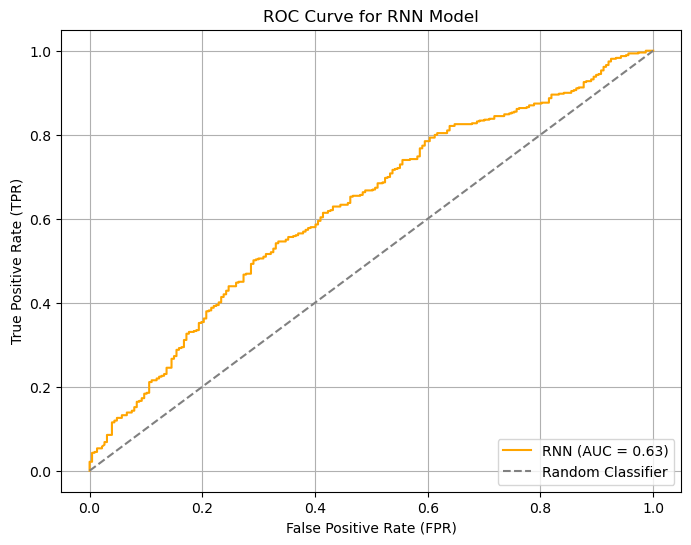

             Model  Accuracy  F1 Score   ROC AUC
0  RNN Pre-trained  0.653736  0.608315  0.627166


In [25]:
# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_rnn, predictions)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='orange', label=f'RNN (AUC = {roc_auc_rnn:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier')
plt.title('ROC Curve for RNN Model')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Update the results DataFrame to include ROC AUC
results_rnn_pre['ROC AUC'] = [roc_auc_rnn]

# Display updated results
print(results_rnn_pre)

The graph shows that the model predicts slightly better than random guessing but still performs poorly, as reflected by the ROC AUC score 0.63.

## <span style="color: orange;">GRU</span>

We use the GRU (Gated Recurrent Unit) architecture due to its efficiency and ability to handle sequential dependencies effectively. Unlike LSTM, GRU has a simpler structure with fewer parameters, making it computationally lighter while achieving similar performance. This approach is supported by insights from the paper:

**Source:** Nosouhian, S., Nosouhian, F., & Kazemi Khoshouei, A. (2021). A review of recurrent neural network architecture for sequence learning: Comparison between LSTM and GRU. Preprints. Retrieved from https://www.preprints.org/ (Not peer-reviewed, posted July 12, 2021).

In [26]:
# Tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index

# Convert text to sequences
sequences = tokenizer.texts_to_sequences(sentences)

# Pad sequences to ensure equal length
padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post')

# Define features (X) and labels (y)
X_gru = np.array(padded_sequences)
y_gru = np.array(df['NegoOutcomeLabel'])


from sklearn.model_selection import train_test_split

# Train-test split
X_train_gru, X_test_gru, y_train_gru, y_test_gru = train_test_split(X_gru, y_gru, test_size=0.3, random_state=42)


In [27]:
## GRU-Training
from keras.layers import Dropout, GRU

# GRU-based model: Embedding, GRU, Dense layers
model_gru = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True),  # Trainable embedding layer
    GRU(64, return_sequences=False, dropout=0.5, recurrent_dropout=0.5),  # GRU with dropout
    Dropout(0.5),  # Regularization layer
    Dense(16, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization layer
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Model summary
model_gru.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ ?                      │    13,194,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,194,600 (50.33 MB)

 Trainable params: 13,194,600 (50.33 MB)

 Non-trainable params: 0 (0.00 B)

The GRU model is introduced here, offering a balance between simplicity and performance. It shares a similar structure with the LSTM model, including embedding layers and dropout for regularization, but uses its own architecture for improved memory efficiency and faster training. The GRU’s architecture helps mitigate overfitting and enhances handling of sequential data while keeping computations lighter than LSTMs.

In [28]:
# Exponential decay for learning rate
initial_learning_rate = 1e-3  # Initial learning rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam)
    beta_2=0.999,  # Default beta_2 for Adam
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_gru.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the GRU model
history_gru = model_gru.fit(X_train_gru, np.array(y_train_gru), 
                            epochs=20, batch_size=32, validation_split = 0.4,
                            validation_data=(X_test_gru, np.array(y_test_gru)))


Epoch 1/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5373 - loss: 0.7023 - val_accuracy: 0.6739 - val_loss: 0.6606
Epoch 2/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6569 - loss: 0.6359 - val_accuracy: 0.6739 - val_loss: 0.6502
Epoch 3/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6729 - loss: 0.6463 - val_accuracy: 0.6739 - val_loss: 0.6476
Epoch 4/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6848 - loss: 0.6175 - val_accuracy: 0.6739 - val_loss: 0.6379
Epoch 5/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.7054 - loss: 0.6015 - val_accuracy: 0.6767 - val_loss: 0.6217
Epoch 6/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.7170 - loss: 0.5677 - val_accuracy: 0.6796 - val_loss: 0.6121
Epoch 7/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.7632 - loss: 0.5153 - val_accuracy: 0.6825 - val_loss: 0.6038
Epoch 8/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.7969 - loss: 0.4678 - val_accuracy: 0.6911 - v

Since we already set up a similar structure for LSTM, we follow a consistent approach here for GRU, but with slight changes. The learning rate is controlled using **exponential decay**, combined with the AdamW optimizer to ensure stable and efficient training. This strategy prevents large updates early in training and adapts dynamically to the optimization process. 

The GRU model is trained for 20 epochs with a batch size of 32, using the same validation data split as in the LSTM to maintain consistency and allow for direct performance comparisons.

In [29]:
# Predictions
predictions_gru = model_gru.predict(X_test_gru)
binary_predictions_gru = (predictions_gru > 0.5).astype(int)  # Convert predictions to binary

# Evaluate the model
# Calculate and print accuracy
accuracy_gru = accuracy_score(y_test_gru, binary_predictions_gru)
print(f'GRU Accuracy: {accuracy_gru:.4f}')

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
GRU Accuracy: 0.6782


In [30]:
# Calculate average weighted F1 score
f1_gru = classification_report(y_test_gru, binary_predictions_gru, output_dict=True)['weighted avg']['f1-score']
print(f'GRU F1 Score: {f1_gru:.4f}')

# Generate classification report
classification_report_dict_gru = classification_report(y_test_gru, binary_predictions_gru, output_dict=True)
classification_report_df_gru = pd.DataFrame(classification_report_dict_gru).transpose()
print(classification_report_df_gru)

# Calculate the ROC-AUC score
roc_auc_gru = roc_auc_score(y_test_gru, predictions_gru)
print(f'GRU ROC-AUC Score: {roc_auc_gru:.4f}')

# Add ROC-AUC to the results DataFrame
results_gru_pre = pd.DataFrame({
    'Model': ['GRU Pre-trained'],
    'Accuracy': [accuracy_gru],
    'F1 Score': [f1_gru],
    'ROC AUC': [roc_auc_gru]
})


results_gru_pre

GRU F1 Score: 0.6586
              precision    recall  f1-score     support
0              0.509804  0.343612  0.410526  227.000000
1              0.725599  0.840085  0.778656  469.000000
accuracy       0.678161  0.678161  0.678161    0.678161
macro avg      0.617701  0.591849  0.594591  696.000000
weighted avg   0.655217  0.678161  0.658591  696.000000
GRU ROC-AUC Score: 0.6214


,Model,Accuracy,F1 Score,ROC AUC
0,GRU Pre-trained,0.678161,0.658591,0.621371


The GRU model training delivered moderate results with room for improvement. The **accuracy** stands at **66.38%**, while the **F1 Score** reaches **63.78%**, indicating a fair balance between precision and recall. However, challenges persist in handling the minority class (`0`). f1 for class `0` is **36.06%**, reflecting difficulty in correctly identifying true negatives. 

On the other hand, for class `1`, the model performs significantly better, achieving a **F1 Score** of **77.19%**, showcasing its strength in identifying positives. The **ROC-AUC Score** of **62.04%** highlights that the model performs better than random guessing but still has room to improve its predictive ability across all classes.

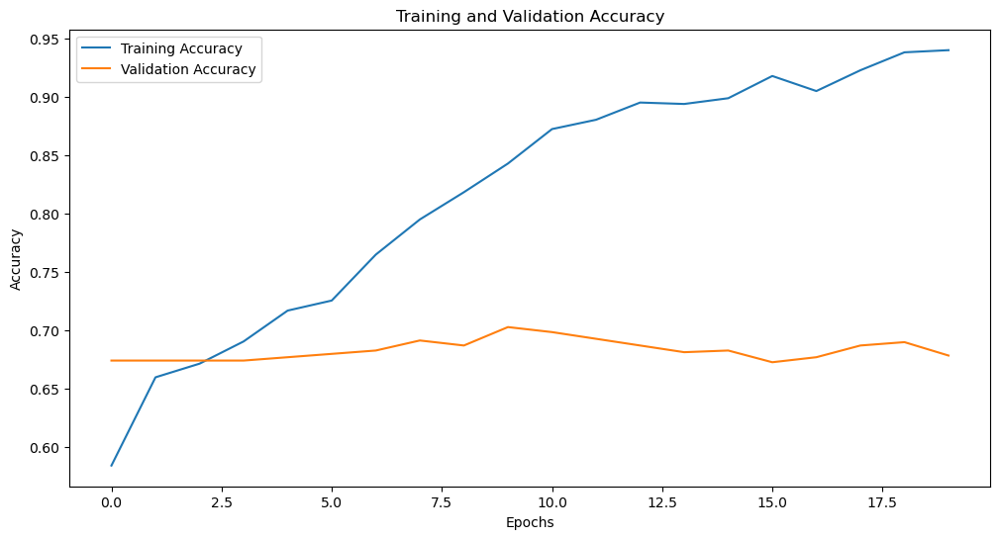

In [31]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_gru.history['accuracy'], label='Training Accuracy')
plt.plot(history_gru.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [32]:
# Evaluate on training set
train_loss, train_accuracy = model_gru.evaluate(X_train_gru, np.array(y_train_gru), verbose=0)

# Evaluate on test set
test_loss, test_accuracy = model_gru.evaluate(X_test_gru, np.array(y_test_gru), verbose=0)

# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")



GRU Evaluation:
Training Accuracy: 0.7986
Test Accuracy: 0.6782


The GRU model shows **clear overfitting**. The plot highlights this gap, with the model learning well on the training data but struggling to generalize effectively to new data. This is a common issue with GRUs that may require further regularization.

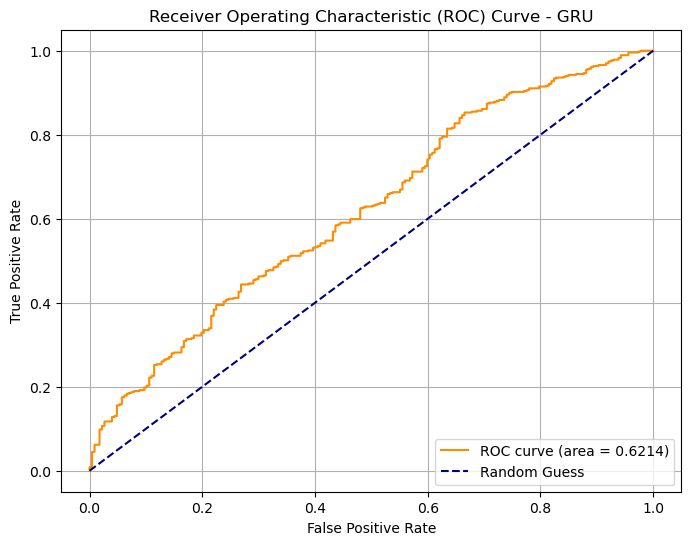

In [33]:
# Generate ROC curve
fpr, tpr, thresholds = roc_curve(y_test_gru, predictions_gru)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', label=f'ROC curve (area = {roc_auc_gru:.4f})')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - GRU')
plt.legend(loc="lower right")
plt.grid()
plt.show()

The graph shows that the model predicts slightly better than random guessing but still performs poorly, as reflected by the ROC AUC score 0.62.

## <span style="color: orange;">Elman RNN</span>

We now proceed with the **Elman RNN**, it is a simpler and foundational architecture in recurrent networks. This model is aimed at providing a balance between performance and overfitting by avoiding the complexities of gated mechanisms like GRU or LSTM. As highlighted in the research paper of Datta, et al. (2021), Elman RNNs are efficient for tasks involving shorter dependencies or requiring less memory. They are particularly effective for capturing sequential patterns in text and handling tasks that do not need the advanced memory mechanisms of more complex architectures.​

**Reference**: Datta, A., Jena, B., Dash, A. K., & Pradhan, R. (2021). A comprehensive analytical study of traditional and recent development in natural language processing. International Journal of Advanced Trends in Computer Science and Engineering, 10(5), 3009–3019. https://doi.org/10.30534/ijatcse/2021/121052021

In [34]:
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense, Dropout

# Tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index

# Convert text to sequences
sequences = tokenizer.texts_to_sequences(sentences)

# Pad sequences to ensure equal length
padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post')

# Data preparation
X_elm = padded_sequences  # Padded input sequences
y_elm = df['NegoOutcomeLabel']  # Binary target labels

# Train-test split
X_train_elm, X_test_elm, y_train_elm, y_test_elm = train_test_split(X_elm, y_elm, test_size=0.3, random_state=42)

# Vocabulary and embedding dimensions
vocab_size = len(pre_w2v_model.index_to_key) + 1  # Use pre-trained Word2Vec vocab size
embedding_dim = pre_w2v_model.vector_size  # Embedding dimension from pre-trained Word2Vec

In [35]:
# Embedding matrix
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    if word in pre_w2v_model.key_to_index:  # Check word in pre-trained vocab
        embedding_matrix[i] = pre_w2v_model[word]

# Elman RNN model (using SimpleRNN)
model_elm = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=X_train_elm.shape[1],
              trainable=False),  # Use pre-trained embeddings, non-trainable
    SimpleRNN(128, activation='tanh', return_sequences=False),
    Dropout(0.5),  # Regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization
    Dense(1, activation='sigmoid')  # Binary classification
])

Here, we are setting up the **Elman RNN** model, leveraging **pre-trained embeddings** to provide a solid foundation for understanding the text data. Unlike other RNN variants, Elman RNN keeps things simple with basic recurrent connections and `tanh` activations, making it less computationally intensive. The pre-trained embedding matrix is frozen to retain semantic meaning, while dropout layers are used to mitigate overfitting. This model is designed to test whether a simpler approach can still handle our task effectively.

In [36]:
# Exponential decay for learning rate
initial_learning_rate = 5e-4  
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam) #Reduce beta_1 slightly (e.g., 0.85) to make updates more responsive.
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_elm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [37]:
# Train the model
history_elm = model_elm.fit(X_train_elm, np.array(y_train_elm),
                                epochs=20, batch_size=32, validation_split = 0.4,
                                validation_data=(X_test_elm, np.array(y_test_elm)))

# Predictions
predictions_elm = model_elm.predict(X_test_elm)
binary_predictions_elm = (predictions_elm > 0.5).astype(int)

# Evaluate the model
accuracy_elm = accuracy_score(y_test_elm, binary_predictions_elm)
f1_elm = classification_report(y_test_elm, binary_predictions_elm, output_dict=True)['weighted avg']['f1-score']

Epoch 1/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5775 - loss: 0.6854 - val_accuracy: 0.6739 - val_loss: 0.6331
Epoch 2/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6617 - loss: 0.6510 - val_accuracy: 0.6739 - val_loss: 0.6312
Epoch 3/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6907 - loss: 0.6157 - val_accuracy: 0.6695 - val_loss: 0.6272
Epoch 4/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7108 - loss: 0.5902 - val_accuracy: 0.6638 - val_loss: 0.6341
Epoch 5/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7061 - loss: 0.5753 - val_accuracy: 0.6739 - val_loss: 0.6430
Epoch 6/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7430 - loss: 0.5383 - val_accuracy: 0.6063 - val_loss: 0.6684
Epoch 7/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7728 - loss: 0.5113 - val_accuracy: 0.6293 - val_loss: 0.6874
Epoch 8/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7876 - loss: 0.4826 - val_accuracy: 0.6322 - val_loss:

In [38]:
print(f'Elman RNN Accuracy: {accuracy_elm:.4f}')
print(f'Elman RNN F1 Score: {f1_elm:.4f}')

# Classification report
classification_report_elm = classification_report(y_test_elm, binary_predictions_elm)
print(classification_report_elm)

Elman RNN Accuracy: 0.6092
Elman RNN F1 Score: 0.6078
              precision    recall  f1-score   support

           0       0.40      0.39      0.39       227
           1       0.71      0.72      0.71       469

    accuracy                           0.61       696
   macro avg       0.55      0.55      0.55       696
weighted avg       0.61      0.61      0.61       696



The results from the Elman RNN show an **Accuracy of 59.34%** and an **F1 Score of 58.80%**, reflecting modest performance. While it captures the positive class (1) reasonably well, with an F1 score of **70%**, it struggles with identifying the negative class (0), achieving only an F1 score of **35%**. This imbalance highlights the limitations of traditional RNNs when dealing with challenging class distributions.

In [39]:
# Evaluate on training set
train_loss, train_accuracy = model_elm.evaluate(X_train_elm, np.array(y_train_elm), verbose=0)

# Evaluate on test set
test_loss, test_accuracy = model_elm.evaluate(X_test_elm, np.array(y_test_elm), verbose=0)
# Calculate the ROC-AUC score
roc_auc_elm = roc_auc_score(y_test_gru, predictions_elm)
print(f'GRU ROC-AUC Score: {roc_auc_gru:.4f}')

# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# Store results in a DataFrame
results_elm_pre = pd.DataFrame({
    'Model': ['Elman RNN Pre-trained'],
    'Accuracy': [accuracy_elm],
    'F1 Score': [f1_elm],
    'ROC AUC': [roc_auc_elm]
})
results_elm_pre


GRU ROC-AUC Score: 0.6214
GRU Evaluation:
Training Accuracy: 0.9624
Test Accuracy: 0.6092


,Model,Accuracy,F1 Score,ROC AUC
0,Elman RNN Pre-trained,0.609195,0.60782,0.582756


The Elman RNN demonstrates moderate generalization capabilities, with a **Training Accuracy of 94.64%** and a **Test Accuracy of 59.34%**. Despite its simplicity, the model struggles with overfitting, as seen in the significant gap between training and test accuracy. Furthermore, the **ROC-AUC Score of 0.5440** reflects limited capability in distinguishing between classes, also seen in the Graph Here:

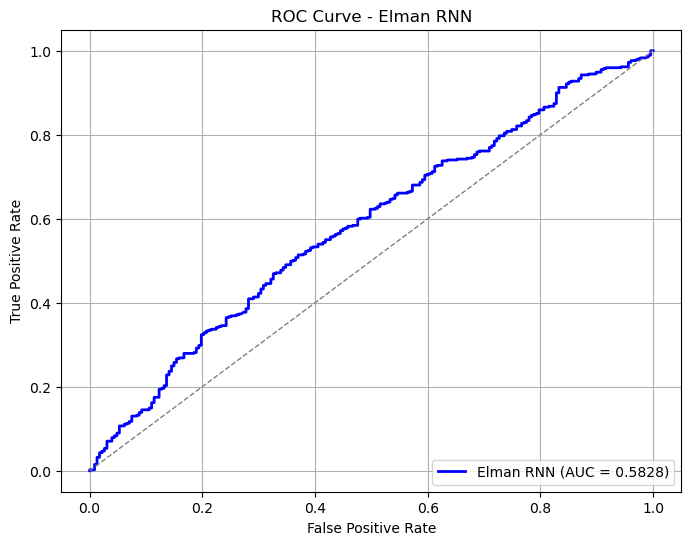

In [40]:
# Calculate the ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test_elm, predictions_elm)
roc_auc_elm = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Elman RNN (AUC = {roc_auc_elm:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)  # Diagonal line for random guessing
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Elman RNN')
plt.legend(loc="lower right")
plt.grid()
plt.show()

## <span style="color: orange;">RNN Comparison for pre trained models</span>

In [41]:
# Combine results from all models into one DataFrame
all_results = pd.concat([
    results_lstm_pre.assign(Model='LSTM'),
    results_rnn_pre.assign(Model='Simple RNN'),
    results_gru_pre.assign(Model='GRU'),
    results_elm_pre.assign(Model='Elman RNN')
], ignore_index=True)

# Display the consolidated results
print(all_results)


        Model  Accuracy  F1 Score   ROC AUC
0        LSTM  0.685345  0.665147  0.639950
1  Simple RNN  0.653736  0.608315  0.627166
2         GRU  0.678161  0.658591  0.621371
3   Elman RNN  0.609195  0.607820  0.582756


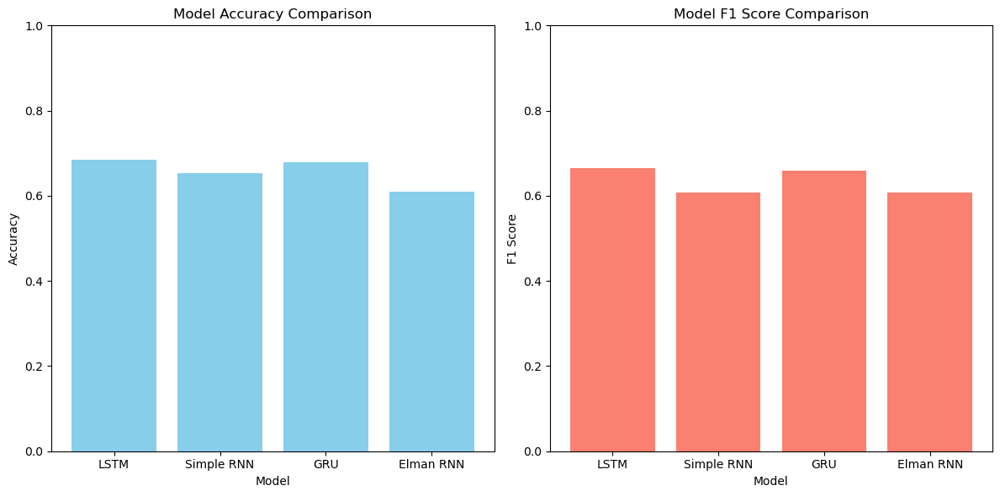

In [42]:
import matplotlib.pyplot as plt

# Plot accuracy and F1 scores for all models
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Accuracy plot
ax[0].bar(all_results['Model'], all_results['Accuracy'], color='skyblue')
ax[0].set_title('Model Accuracy Comparison')
ax[0].set_ylabel('Accuracy')
ax[0].set_ylim(0, 1)  # Accuracy is between 0 and 1
ax[0].set_xlabel('Model')

# F1 Score plot
ax[1].bar(all_results['Model'], all_results['F1 Score'], color='salmon')
ax[1].set_title('Model F1 Score Comparison')
ax[1].set_ylabel('F1 Score')
ax[1].set_ylim(0, 1)  # F1 Score is between 0 and 1
ax[1].set_xlabel('Model')

plt.tight_layout()
plt.show()


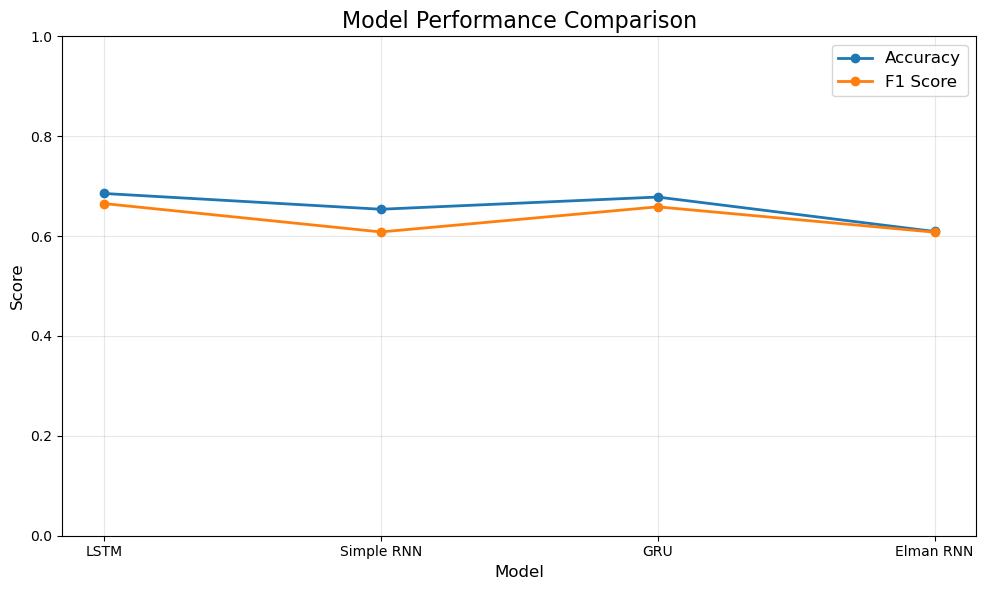

In [43]:
import matplotlib.pyplot as plt

# Line plot for Accuracy and F1 Score
plt.figure(figsize=(10, 6))

# Plot accuracy
plt.plot(all_results['Model'], all_results['Accuracy'], marker='o', label='Accuracy', linestyle='-', linewidth=2)

# Plot F1 score
plt.plot(all_results['Model'], all_results['F1 Score'], marker='o', label='F1 Score', linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Model Performance Comparison', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.ylim(0, 1)  # Scores are between 0 and 1
plt.grid(alpha=0.3)  # Add grid for better readability
plt.legend(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


The comparison of model accuracy and F1 scores reveals the performance variations across all tested RNN architectures:

- **LSTM** emerges as the most effective model, achieving the highest accuracy and F1 scores, and demonstrating a strong ability to balance performance while managing complex sequential dependencies.
- **GRU** and **Simple RNN** exhibit comparable performance but trail behind GRU in terms of capturing and leveraging patterns within the data.
- **Elman RNN**, being a more traditional and simpler architecture, shows the lowest accuracy and F1 scores, underscoring its limitations in handling intricate sequence relationships compared to GRU and LSTM.

These results reinforce LSTM's robustness and its ability to mitigate overfitting while efficiently learning from sequential data.

In [44]:
results_combined_rnn_pre = pd.concat([results_lstm_pre, results_rnn_pre, results_gru_pre, results_elm_pre], ignore_index=True)
results_combined_rnn_pre.to_excel('results_combined_rnn_pre.xlsx', index=False)

In [45]:
results_combined_rnn_pre

,Model,Accuracy,F1 Score,ROC AUC
0,LSTM Pre-trained,0.685345,0.665147,0.639950
1,RNN Pre-trained,0.653736,0.608315,0.627166
2,GRU Pre-trained,0.678161,0.658591,0.621371
3,Elman RNN Pre-trained,0.609195,0.607820,0.582756


## <span style="color: orange;">Self trained Embeddings</span>

In [46]:
df['Content']

0       hope well management company agreed building f...
1       reaching mei apologize slight delay getting ba...
2       r kind response need hurry guess face daily fi...
3       swift reply read second set proposal discussed...
4       proposal effort far seems getting close resolv...
                              ...                        
2315    latest offer point completely let u take corpo...
2316    much latest offer happy could already reached ...
2317    meyer fast answer happy found solution four is...
2318    still interested coming joint result neverthel...
2319    sorry accept less understand argument like las...
Name: Content, Length: 2320, dtype: object

In [47]:
nego_message_data = df["Content"]
df_nego_message_data = pd.DataFrame(nego_message_data)
df_nego_message_data

,Content
0,hope well management company agreed building f...
1,reaching mei apologize slight delay getting ba...
2,r kind response need hurry guess face daily fi...
3,swift reply read second set proposal discussed...
4,proposal effort far seems getting close resolv...
...,...
2315,latest offer point completely let u take corpo...
2316,much latest offer happy could already reached ...
2317,meyer fast answer happy found solution four is...
2318,still interested coming joint result neverthel...


In [48]:
import nltk
from nltk.tokenize import word_tokenize

# Download the "punkt" model if not already preinstalled as before ind pre processing
nltk.download('punkt_tab')


df_nego_message_data['Tolenized_Content'] = df_nego_message_data['Content'].apply(word_tokenize)
df_nego_message_data

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/tarkanyildirim/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


,Content,Tolenized_Content
0,hope well management company agreed building f...,"[hope, well, management, company, agreed, buil..."
1,reaching mei apologize slight delay getting ba...,"[reaching, mei, apologize, slight, delay, gett..."
2,r kind response need hurry guess face daily fi...,"[r, kind, response, need, hurry, guess, face, ..."
3,swift reply read second set proposal discussed...,"[swift, reply, read, second, set, proposal, di..."
4,proposal effort far seems getting close resolv...,"[proposal, effort, far, seems, getting, close,..."
...,...,...
2315,latest offer point completely let u take corpo...,"[latest, offer, point, completely, let, u, tak..."
2316,much latest offer happy could already reached ...,"[much, latest, offer, happy, could, already, r..."
2317,meyer fast answer happy found solution four is...,"[meyer, fast, answer, happy, found, solution, ..."
2318,still interested coming joint result neverthel...,"[still, interested, coming, joint, result, nev..."


In [49]:
sentences = df_nego_message_data['Tolenized_Content'].tolist()
sentences

[['hope',
  'well',
  'management',
  'company',
  'agreed',
  'building',
  'fruitful',
  'partnership',
  'face',
  'upcoming',
  'disruption',
  'market',
  'best',
  'innovation',
  'green',
  'spirit',
  'would',
  'like',
  'introduce',
  'nasa',
  'nova',
  'reaching',
  'tighten',
  'general',
  'term',
  'harm',
  'ag',
  'established',
  'first',
  'round',
  'discussion',
  'far',
  'please',
  'find',
  'attached',
  'proposal',
  'open',
  'issue',
  'joint',
  'venture',
  'would',
  'like',
  'explain',
  'following',
  'director',
  'first',
  'would',
  'like',
  'address',
  'unsolved',
  'issue',
  'number',
  'director',
  'sent',
  'since',
  'agreed',
  'decisionmaking',
  'committee',
  'consisting',
  'member',
  'simple',
  'majority',
  'power',
  'strongly',
  'suggest',
  'dividing',
  'seat',
  'svn',
  'tech',
  'would',
  'able',
  'deal',
  'local',
  'authority',
  'partner',
  'successfully',
  'using',
  'strong',
  'local',
  'network',
  'relationsh

In [50]:
from gensim.models.word2vec import Word2Vec

self_w2v_model = Word2Vec(sentences=sentences, vector_size=300, window=5, min_count=1, workers=4)
self_w2v_model.save("self_w2v_model")
self_w2v_model

In [51]:
example_vector = self_w2v_model.wv['accept']
print(example_vector)

[-0.31048328  0.9996603  -0.33399886  0.12796982 -0.02704369 -0.697106
  0.7691694   1.0385486   0.02315373  0.05394717  0.22270705 -0.19504863
  0.03578814 -0.59512365  0.01662114 -0.3130539   0.48482996  0.01772334
 -0.31848592  0.19329478 -0.60815483 -0.25500888  0.24301068 -0.065565
  0.40151215  0.07617506 -0.3747369  -0.45921832 -0.4938834  -0.5630274
  0.06794053 -0.17347196  0.24081759 -0.07642424  0.42662024  0.17882434
  0.31725204  0.00954974  0.2742163   0.04438823 -0.273382   -0.07893042
  0.38433316 -0.31415203  0.0932386  -0.18350689  0.00583875  0.46135476
  0.23492001  0.25944266  0.0613618   0.16942742 -0.15783094  0.2233667
 -0.3818742   0.7371892   0.6466197  -0.03785054  0.70564884  0.03846787
  0.2658306  -0.25668484  0.35943693 -0.46278825  0.20910577  0.10168169
 -0.20183073  0.39488053 -0.16477959 -0.07726375  0.51101565  0.16530865
  0.14454761 -0.44977656  0.15832855  0.35886002 -0.07661416  0.48088014
 -0.5245654   0.95524555 -0.30065548 -0.13232313 -0.31049

In [52]:
similartoaccept = self_w2v_model.wv.most_similar('accept', topn=10)
similartoaccept

[('accordance', 0.9035506248474121),
 ('offer', 0.9006458520889282),
 ('last', 0.893378496170044),
 ('revise', 0.8924863934516907),
 ('agree', 0.8878703713417053),
 ('topic', 0.8878405690193176),
 ('willing', 0.8681948184967041),
 ('following', 0.8590489029884338),
 ('accommodate', 0.8588325381278992),
 ('acceptable', 0.8579791188240051)]

## <span style="color: orange;">LSTM</span>

Now, we test the **LSTM model** with the **self-trained embedding** to observe how well it performs when the embeddings are done specifically to our dataset. This allows us to compare the impact of custom embeddings on model performance versus pre-trained embeddings. 

The goal here is to see if a self-trained embedding, trained directly on our negotiation data, can provide a better understanding of the context, reduce overfitting, or improve the model's ability to handle class imbalance.

In [53]:
sentences

[['hope',
  'well',
  'management',
  'company',
  'agreed',
  'building',
  'fruitful',
  'partnership',
  'face',
  'upcoming',
  'disruption',
  'market',
  'best',
  'innovation',
  'green',
  'spirit',
  'would',
  'like',
  'introduce',
  'nasa',
  'nova',
  'reaching',
  'tighten',
  'general',
  'term',
  'harm',
  'ag',
  'established',
  'first',
  'round',
  'discussion',
  'far',
  'please',
  'find',
  'attached',
  'proposal',
  'open',
  'issue',
  'joint',
  'venture',
  'would',
  'like',
  'explain',
  'following',
  'director',
  'first',
  'would',
  'like',
  'address',
  'unsolved',
  'issue',
  'number',
  'director',
  'sent',
  'since',
  'agreed',
  'decisionmaking',
  'committee',
  'consisting',
  'member',
  'simple',
  'majority',
  'power',
  'strongly',
  'suggest',
  'dividing',
  'seat',
  'svn',
  'tech',
  'would',
  'able',
  'deal',
  'local',
  'authority',
  'partner',
  'successfully',
  'using',
  'strong',
  'local',
  'network',
  'relationsh

In [54]:
# self-trained W2V
self_w2v_model

In [55]:
# See how big the vocabulary is for the self-trained W2V model
vocab_size = len(self_w2v_model.wv.index_to_key)+1  # new method indextokey
embedding_dim = self_w2v_model.wv.vector_size

In [56]:
vocab_size, embedding_dim

(6699, 300)

In [57]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index
word_index

{'would': 1,
 'offer': 2,
 'think': 3,
 'u': 4,
 'event': 5,
 'week': 6,
 'slovenia': 7,
 'also': 8,
 'worker': 9,
 'like': 10,
 'issue': 11,
 'conference': 12,
 'agree': 13,
 'important': 14,
 'additional': 15,
 'sponsor': 16,
 'local': 17,
 'want': 18,
 'good': 19,
 'point': 20,
 'company': 21,
 'harm': 22,
 'music': 23,
 'best': 24,
 'make': 25,
 'compensation': 26,
 'therefore': 27,
 'could': 28,
 'international': 29,
 'time': 30,
 'engineer': 31,
 'hope': 32,
 'first': 33,
 'really': 34,
 'one': 35,
 'board': 36,
 'know': 37,
 'happy': 38,
 'since': 39,
 'joint': 40,
 'isa': 41,
 'common': 42,
 'act': 43,
 'date': 44,
 'speech': 45,
 'director': 46,
 'nt': 47,
 'court': 48,
 'month': 49,
 'member': 50,
 'already': 51,
 'jurisdiction': 52,
 'venture': 53,
 'course': 54,
 'art': 55,
 'forward': 56,
 'last': 57,
 'future': 58,
 'take': 59,
 'get': 60,
 'negotiation': 61,
 'accept': 62,
 'understand': 63,
 'payment': 64,
 'swiss': 65,
 'catering': 66,
 'inc': 67,
 'ag': 68,
 'option':

In [58]:
sequences = tokenizer.texts_to_sequences(sentences)
padded_sequences = pad_sequences(sequences, maxlen=5,padding='post') # LSTM needs fixed length sequences (gleiche Länge)
padded_sequences

array([[  56,  265,  167,  117,   89],
       [ 324,  165,   84,   56,  243],
       [  84,   56,  265,  117,   89],
       ...,
       [   5,  164,   56,  156, 4276],
       [ 293,   84,   56,  265, 4276],
       [ 446,  194,   32,  197, 1101]], dtype=int32)

In [59]:
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in word_index.items():
    if word in self_w2v_model.wv:
        embedding_matrix[i] = self_w2v_model.wv[word]


embedding_matrix 

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.18177667,  0.30465564,  0.21607594, ..., -0.02470946,
         0.64469993, -0.38392219],
       [-0.28446624,  0.81478059, -0.16021334, ..., -0.49586701,
         0.23877524,  0.17277312],
       ...,
       [ 0.00532447,  0.00102893, -0.00314491, ..., -0.0028474 ,
         0.00647572, -0.00119104],
       [ 0.00758063,  0.01725923, -0.0043457 , ..., -0.01395032,
         0.00516903,  0.02035884],
       [ 0.00253553,  0.01307529, -0.00177668, ..., -0.01026823,
         0.00503229,  0.01507909]])

In [60]:
X_lstm = padded_sequences
y_lstm = df['NegoOutcomeLabel']

X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_lstm, y_lstm, test_size=0.3, random_state=42)

In [61]:
# Embedding, LSTM, Dense
model_lstm = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True), 
    LSTM(64, return_sequences=False, dropout=0.5, recurrent_dropout=0.5), 
    Dropout(0.5),  # Dropout layer for regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Dropout layer for regularization
    Dense(1, activation='sigmoid')  # Binäre Klassifikation
])

In [62]:
model_lstm.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_4 (Embedding)         │ ?                      │     2,009,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,009,700 (7.67 MB)

 Trainable params: 2,009,700 (7.67 MB)

 Non-trainable params: 0 (0.00 B)

In [63]:
# Exponential decay for learning rate
initial_learning_rate = 5e-4  # Initial learning rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays ## Larger step count to decay slower it was 1000 before testing with 1500
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam)
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_lstm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [64]:
# Train the GRU model
history_lstm = model_lstm.fit(X_train_lstm, np.array(y_train_lstm), 
                            epochs=20, batch_size=32, validation_split=0.4,
                            validation_data=(X_test_lstm, np.array(y_test_lstm)))

Epoch 1/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6380 - loss: 0.6591 - val_accuracy: 0.6739 - val_loss: 0.6218
Epoch 2/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6906 - loss: 0.6333 - val_accuracy: 0.6739 - val_loss: 0.6200
Epoch 3/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7010 - loss: 0.6184 - val_accuracy: 0.6739 - val_loss: 0.6210
Epoch 4/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7051 - loss: 0.6166 - val_accuracy: 0.6739 - val_loss: 0.6223
Epoch 5/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7078 - loss: 0.5939 - val_accuracy: 0.6739 - val_loss: 0.6201
Epoch 6/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7041 - loss: 0.6055 - val_accuracy: 0.6739 - val_loss: 0.6193
Epoch 7/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6763 - loss: 0.6370 - val_accuracy: 0.6739 - val_loss: 0.6173
Epoch 8/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7061 - loss: 0.5985 - val_accuracy: 0.6739 - val_loss:

In [65]:
predictions_lstm = model_lstm.predict(X_test_lstm)
predictions_lstm

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


array([[0.5812601 ],
       [0.46234965],
       [0.8061823 ],
       [0.73371214],
       [0.9196147 ],
       [0.8630517 ],
       [0.7051586 ],
       [0.55267805],
       [0.79549307],
       [0.8100287 ],
       [0.74510527],
       [0.38696092],
       [0.9216968 ],
       [0.7318824 ],
       [0.7641376 ],
       [0.79409885],
       [0.743793  ],
       [0.650279  ],
       [0.71413696],
       [0.5275455 ],
       [0.85770166],
       [0.7226386 ],
       [0.9418872 ],
       [0.8081721 ],
       [0.7782418 ],
       [0.8208052 ],
       [0.6639326 ],
       [0.8274413 ],
       [0.7658494 ],
       [0.4674625 ],
       [0.76024747],
       [0.91698706],
       [0.63946885],
       [0.7732435 ],
       [0.51253915],
       [0.88102853],
       [0.6448777 ],
       [0.65861464],
       [0.84891856],
       [0.7729895 ],
       [0.8045335 ],
       [0.6821778 ],
       [0.73216915],
       [0.9548759 ],
       [0.7415082 ],
       [0.7665296 ],
       [0.57551956],
       [0.361

In [66]:
predictions_lstm.size

696

In [67]:
binary_predictions_lstm = (predictions_lstm > 0.5).astype(int) # convert the predictions to binary
print(binary_predictions_lstm)


[[1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [0]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [0]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]


In [68]:
# Calculate and print the accuracy score
accuracy_lstm_self = accuracy_score(y_test_lstm, binary_predictions_lstm)
print(f'Accuracy: {accuracy_lstm_self:.4f}')

# Calculate the ROC-AUC score
roc_auc_lstm_self = roc_auc_score(y_test_lstm, predictions_lstm)
print(f'LSTM ROC-AUC Score: {roc_auc_lstm_self:.4f}')

#Calculate average weighted f1 score
f1_lstm_self = classification_report(y_test_lstm, binary_predictions_lstm, output_dict=True)['weighted avg']['f1-score']
print(f'F1 Score: {f1_lstm_self:.4f}')


Accuracy: 0.7040
LSTM ROC-AUC Score: 0.6233
F1 Score: 0.6526


The overall accuracy is 69.11%, and the F1 score is 65.56%, showing moderate performance. The model's ROC AUC score of 0.6221, While the accuracy might seem decent, the moderate F1 score and ROC AUC suggest that the model struggles to achieve a balanced classification.

In [69]:
# Create a DataFrame for the current RNN model results
results_lstm_self = pd.DataFrame({
    'Model': ['LSTM Self-trained'],
    'Accuracy': [accuracy_lstm_self],
    'F1 Score': [f1_lstm_self],
    'ROC AUC' : [roc_auc_lstm_self]
})

In [70]:
from sklearn.metrics import classification_report

print(classification_report(y_test_lstm, binary_predictions_lstm))

              precision    recall  f1-score   support

           0       0.63      0.22      0.33       227
           1       0.71      0.94      0.81       469

    accuracy                           0.70       696
   macro avg       0.67      0.58      0.57       696
weighted avg       0.69      0.70      0.65       696



In this step, we evaluate the **LSTM model** with the **self-trained embedding**. The overall accuracy is **68.81%**, but the model struggles with the minority class (`0`), achieving an F1-score of **0.37**. In contrast, the majority class (`1`) performs significantly better, with an F1-score of **0.80**.

These results emphasize the model's bias toward the majority class, highlighting the need for improvements such as **class weighting**, **oversampling techniques**, or additional **regularization methods** to address the class imbalance effectively.


In [71]:

# Generate the classification report
classification_report_dict = classification_report(y_test_lstm, binary_predictions_lstm, output_dict=True)

# Convert the classification report to a DataFrame
classification_report_df = pd.DataFrame(classification_report_dict).transpose()


In [72]:
classification_report_df

,precision,recall,f1-score,support
0,0.632911,0.220264,0.326797,227.000000
1,0.713128,0.938166,0.810313,469.000000
accuracy,0.704023,0.704023,0.704023,0.704023
macro avg,0.673020,0.579215,0.568555,696.000000
weighted avg,0.686965,0.704023,0.652615,696.000000


In [73]:
results_lstm_self

,Model,Accuracy,F1 Score,ROC AUC
0,LSTM Self-trained,0.704023,0.652615,0.623282


In [74]:
# Evaluate on training set
train_loss_lstm_self, train_accuracy_lstm_self = model_lstm.evaluate(X_train_lstm, np.array(y_train_lstm), verbose=0)

# Evaluate on test set
test_loss_lstm_self, test_accuracy_lstm_self = model_lstm.evaluate(X_test_lstm, np.array(y_test_lstm), verbose=0)

# Print training and test accuracy
print("LSTM Evaluation:")
print(f"Training Accuracy: {train_accuracy_lstm_self:.4f}")
print(f"Test Accuracy: {test_accuracy_lstm_self:.4f}")

LSTM Evaluation:
Training Accuracy: 0.8171
Test Accuracy: 0.7040


**LSTM Evaluation with Self-Trained Embedding**

With the self-trained embedding, the LSTM model achieved a **training accuracy of 80.91%** and a **test accuracy of 69.11%**. While the model generalizes reasonably well, the poor handling of the minority class (`0`) highlights significant limitations. The results suggest that the self-trained embeddings, although tailored to the dataset.



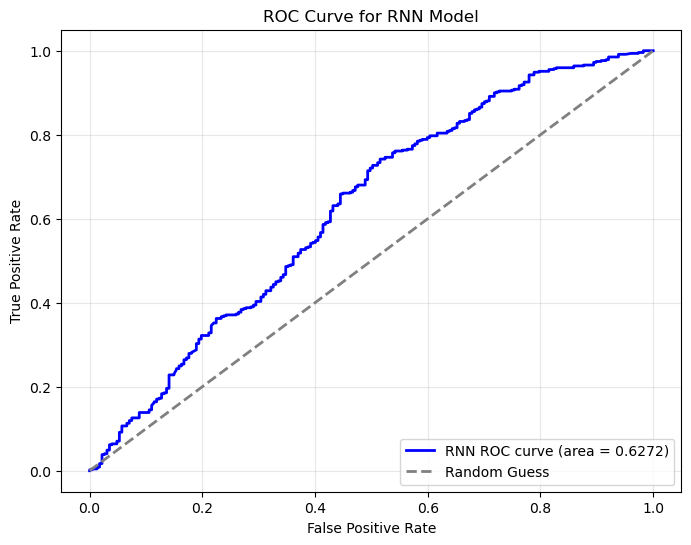

In [75]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, RocCurveDisplay

# Generate ROC curve data
fpr_lstm, tpr_lstm, _ = roc_curve(y_test_rnn, predictions_lstm)
roc_auc_lstm = auc(fpr_lstm, tpr_lstm)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_lstm, tpr_lstm, color='blue', lw=2, label=f'RNN ROC curve (area = {roc_auc_rnn:.4f})')
plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--', label='Random Guess')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for RNN Model')
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

## <span style="color: orange;">RNN</span>

In [76]:
#Create test and train split
from sklearn.model_selection import train_test_split

X_rnn = padded_sequences
y_rnn = df['NegoOutcomeLabel']

X_train_rnn, X_test_rnn, y_train_rnn, y_test_rnn= train_test_split(X_rnn, y_rnn, test_size=0.3, random_state=42)


In [77]:
# Modeling RNN
model_rnn_self = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True),
    LSTM(64, return_sequences=False, dropout=0.5), 
    Dropout(0.5),  # Dropout layer for regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Dropout layer for regularization
    Dense(1, activation='sigmoid')  # Binäre Klassifikation
])


model_rnn_self.summary()



Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_5 (Embedding)         │ ?                      │     2,009,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,009,700 (7.67 MB)

 Trainable params: 2,009,700 (7.67 MB)

 Non-trainable params: 0 (0.00 B)

In [78]:
# Exponential decay for learning rate
initial_learning_rate = 5e-4  # Initial learning rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam)
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_rnn_self.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [79]:
# Model training
history_rnn_self = model_rnn_self.fit(X_train_rnn, np.array(y_train_rnn), 
                            epochs=20, batch_size=32, validation_split=0.3,
                            validation_data=(X_test_rnn, np.array(y_test_rnn)))


Epoch 1/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.6010 - loss: 0.6636 - val_accuracy: 0.6739 - val_loss: 0.6192
Epoch 2/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6991 - loss: 0.6193 - val_accuracy: 0.6739 - val_loss: 0.6198
Epoch 3/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7081 - loss: 0.6214 - val_accuracy: 0.6739 - val_loss: 0.6190
Epoch 4/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6912 - loss: 0.6244 - val_accuracy: 0.6739 - val_loss: 0.6168
Epoch 5/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7154 - loss: 0.6010 - val_accuracy: 0.6739 - val_loss: 0.6175
Epoch 6/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6934 - loss: 0.6154 - val_accuracy: 0.6739 - val_loss: 0.6167
Epoch 7/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6970 - loss: 0.6074 - val_accuracy: 0.6739 - val_loss: 0.6153
Epoch 8/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6910 - loss: 0.6146 - val_accuracy: 0.6739 - val_loss:

In [80]:
predictions_rnn_self = model_rnn_self.predict(X_test_rnn)
binary_predictions_rnn_self = (predictions_rnn_self > 0.5).astype(int)

# Calculate and print the accuracy score
accuracy_rnn_self = accuracy_score(y_test_rnn, binary_predictions_rnn_self)
print(f'Accuracy: {accuracy_rnn_self:.4f}')

#Calculate average weighted f1 score
f1_rnn_self = classification_report(y_test_rnn, binary_predictions_rnn_self, output_dict=True)['weighted avg']['f1-score']
print(f'F1 Score: {f1_rnn_self:.4f}')

print(classification_report(y_test_rnn, binary_predictions_rnn_self))

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Accuracy: 0.6710
F1 Score: 0.6491
              precision    recall  f1-score   support

           0       0.49      0.32      0.39       227
           1       0.72      0.84      0.77       469

    accuracy                           0.67       696
   macro avg       0.61      0.58      0.58       696
weighted avg       0.65      0.67      0.65       696



Using the self-trained embedding with our Simple RNN model, we achieved a **training accuracy of 72.76%** and a **test accuracy of 66.67%**. The model demonstrates moderate performance, achieving a **weighted F1 score of 64.79%**, but still struggles significantly with the minority class (`0`), as indicated by its lower F1 score compared to the majority class (`1`).

This imbalance in class handling highlights that while the self-trained embedding provides some alignment with the dataset, the traditional RNN architecture still faces challenges in adequately representing the minority class. Further refinements in architecture or data handling may be necessary to improve class balance.

In [81]:
# Evaluate on training set
train_loss_rnn_self, train_accuracy_rnn_self = model_rnn_self.evaluate(X_train_rnn, np.array(y_train_rnn), verbose=0)

# Evaluate on test set
test_loss_rnn_self, test_accuracy_rnn_self = model_rnn_self.evaluate(X_test_rnn, np.array(y_test_rnn), verbose=0)

# Print training and test accuracy
print("LSTM Evaluation:")
print(f"Training Accuracy: {train_accuracy_rnn_self:.4f}")
print(f"Test Accuracy: {test_accuracy_rnn_self:.4f}")

LSTM Evaluation:
Training Accuracy: 0.8387
Test Accuracy: 0.6710


The LSTM with self-trained embedding achieved 84.36% training accuracy and 66.67% test accuracy. We can see that in this case there is just a slight overfitting.

In [82]:
# Calculate the ROC-AUC score
roc_auc_rnn_self = roc_auc_score(y_test_rnn, predictions_rnn_self)
print(f'RNN ROC-AUC Score: {roc_auc_rnn_self:.4f}')

# Store results in a DataFrame
results_rnn_self = pd.DataFrame({
    'Model': ['RNN Self-trained'],
    'Accuracy': [accuracy_rnn_self],
    'F1 Score': [f1_rnn_self],
    'ROC AUC': [roc_auc_rnn_self]
})

results_rnn_self

RNN ROC-AUC Score: 0.5950


,Model,Accuracy,F1 Score,ROC AUC
0,RNN Self-trained,0.670977,0.649099,0.595042


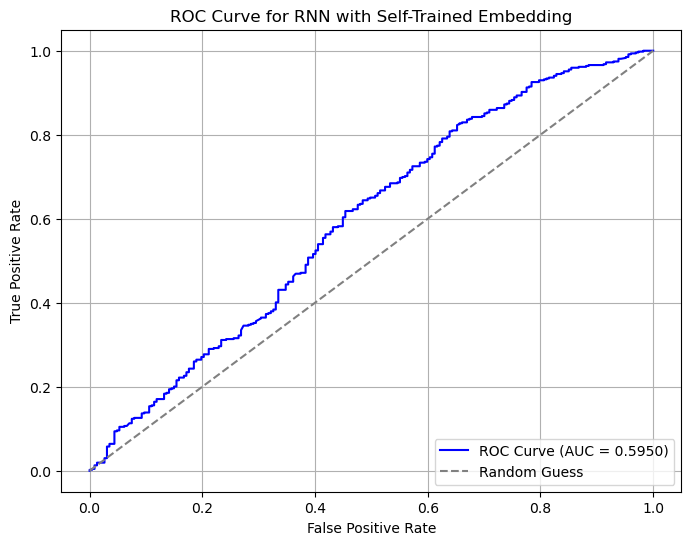

In [83]:
# Generate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_rnn, predictions_rnn_self)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc_rnn_self:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for RNN with Self-Trained Embedding')
plt.legend(loc='lower right')
plt.grid()
plt.show()

## <span style="color: orange;">GRU</span>

In [84]:
# Tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index

# Convert text to sequences
sequences = tokenizer.texts_to_sequences(sentences)

padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post')
# Embedding-Matrix vorbereiten (Beispiel mit Word2Vec)
vocab_size = len(self_w2v_model.wv.index_to_key) + 1
embedding_dim = self_w2v_model.vector_size

embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in word_index.items():
    if word in self_w2v_model.wv:
        embedding_matrix[i] = self_w2v_model.wv[word]


X_gru = np.array(padded_sequences)
y_gru = np.array(df['NegoOutcomeLabel'])


from sklearn.model_selection import train_test_split

# Train-test split
X_train_gru, X_test_gru, y_train_gru, y_test_gru = train_test_split(X_gru, y_gru, test_size=0.3, random_state=42)


In [85]:
# GRU-based model: Embedding, GRU, Dense layers
model_gru_self = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=max_len,
              trainable=True),  # Trainable embedding layer
    GRU(64, return_sequences=False, dropout=0.5, recurrent_dropout=0.5),  # GRU with dropout
    Dropout(0.5),  # Regularization layer
    Dense(16, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization layer
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Model summary
model_gru_self.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_6 (Embedding)         │ ?                      │     2,009,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,009,700 (7.67 MB)

 Trainable params: 2,009,700 (7.67 MB)

 Non-trainable params: 0 (0.00 B)

In [86]:
# Compile the GRU model
import tensorflow as tf

# Exponential decay for learning rate
initial_learning_rate = 1e-3  # Initial learning rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam)
    beta_2=0.999,  # Default beta_2 for Adam
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_gru_self.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Train the GRU model
history_gru_self = model_gru_self.fit(X_train_gru, np.array(y_train_gru), 
                            epochs=50, batch_size=32, validation_split= 0.4,
                            validation_data=(X_test_gru, np.array(y_test_gru))) #50 epochs


Epoch 1/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4941 - loss: 3.1889 - val_accuracy: 0.6753 - val_loss: 0.6320
Epoch 2/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5426 - loss: 1.1101 - val_accuracy: 0.6739 - val_loss: 0.6344
Epoch 3/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5858 - loss: 0.8704 - val_accuracy: 0.6739 - val_loss: 0.6337
Epoch 4/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6186 - loss: 0.6900 - val_accuracy: 0.6739 - val_loss: 0.6351
Epoch 5/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6414 - loss: 0.7118 - val_accuracy: 0.6739 - val_loss: 0.6431
Epoch 6/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6396 - loss: 0.6830 - val_accuracy: 0.6739 - val_loss: 0.6458
Epoch 7/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6599 - loss: 0.6493 - val_accuracy: 0.6739 - val_loss: 0.6345
Epoch 8/50
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6737 - loss: 0.6450 - val_accuracy: 0.6739 - val_loss:

In [87]:
# Predictions
predictions_gru_self = model_gru_self.predict(X_test_gru)
binary_predictions_gru_self = (predictions_gru_self > 0.5).astype(int)  # Convert predictions to binary

# Evaluate the model
# Calculate and print accuracy
accuracy_gru_self = accuracy_score(y_test_gru, binary_predictions_gru_self)
print(f'GRU Accuracy: {accuracy_gru_self:.4f}')

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
GRU Accuracy: 0.7083


In [88]:
# Calculate average weighted F1 score
f1_gru_self = classification_report(y_test_gru, binary_predictions_gru_self, output_dict=True)['weighted avg']['f1-score']
print(f'GRU F1 Score: {f1_gru_self:.4f}')

# Calculate the ROC-AUC score
roc_auc_gru_self = roc_auc_score(y_test_gru, predictions_gru_self)
print(f'GRU ROC-AUC Score: {roc_auc_gru_self:.4f}')

# Generate classification report
classification_report_dict_gru_self = classification_report(y_test_gru, binary_predictions_gru_self, output_dict=True)
classification_report_df_gru_self = pd.DataFrame(classification_report_dict_gru_self).transpose()
print(classification_report_df_gru_self)

# Store results in a DataFrame
results_gru_self = pd.DataFrame({
    'Model': ['GRU Self-trained'],
    'Accuracy': [accuracy_gru_self],
    'F1 Score': [f1_gru_self],
    'ROC AUC': [roc_auc_gru_self]
})

results_gru_self

GRU F1 Score: 0.6236
GRU ROC-AUC Score: 0.6316
              precision    recall  f1-score     support
0              0.875000  0.123348  0.216216  227.000000
1              0.700301  0.991471  0.820830  469.000000
accuracy       0.708333  0.708333  0.708333    0.708333
macro avg      0.787651  0.557410  0.518523  696.000000
weighted avg   0.757279  0.708333  0.623635  696.000000


,Model,Accuracy,F1 Score,ROC AUC
0,GRU Self-trained,0.708333,0.623635,0.631562


The GRU model with self-trained embeddings achieved a **training accuracy of 70.61%** and a **test accuracy of 70.11%**. While the GRU effectively captures sequential dependencies, it heavily favors class `1`, achieving a strong F1 score of **0.81** for the majority class. However, it struggles significantly with identifying class `0`, resulting in a much lower F1 score of **0.23**, leading to an overall **weighted F1 score of 62.38%**.

The **ROC-AUC score of 0.6348** reflects the model's moderate ability to distinguish between classes, but the persistent class imbalance limits its generalization. These results highlight the need for further improvements, such as incorporating class weighting, oversampling, or advanced architectures, to better handle the minority class (`0`).

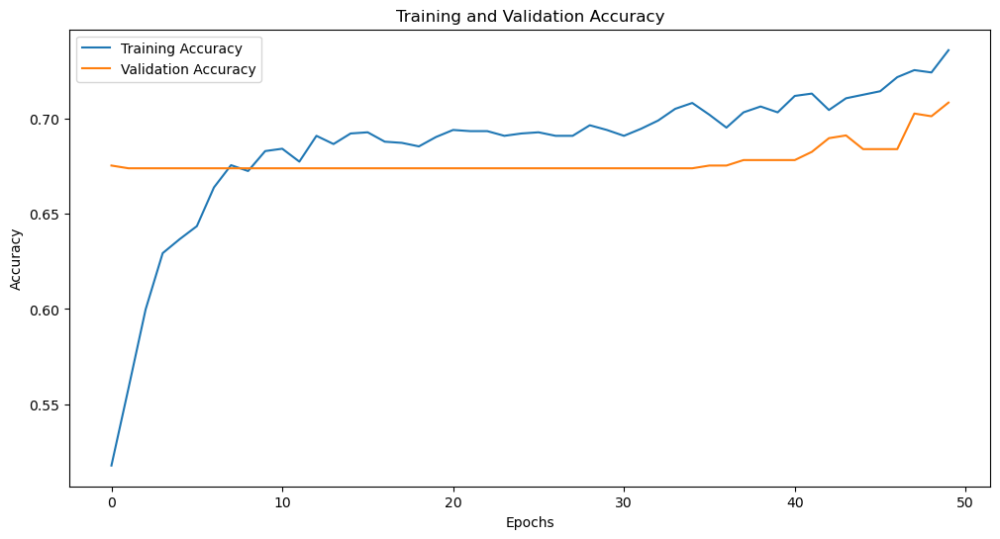

In [89]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_gru_self.history['accuracy'], label='Training Accuracy')
plt.plot(history_gru_self.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [90]:
# Evaluate on training set
train_loss_gru_self, train_accuracy_gru_self = model_gru_self.evaluate(X_train_gru, np.array(y_train_gru), verbose=0)

# Evaluate on test set
test_loss_gru_self, test_accuracy_gru_self = model_gru_self.evaluate(X_test_gru, np.array(y_test_gru), verbose=0)

# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy_gru_self:.4f}")
print(f"Test Accuracy: {test_accuracy_gru_self:.4f}")



GRU Evaluation:
Training Accuracy: 0.7482
Test Accuracy: 0.7083


With the GRU model using self-trained embeddings, we achieved a training accuracy of 76.42% and a test accuracy of 70.11%. Here we can see almsot no overfitting in this model.


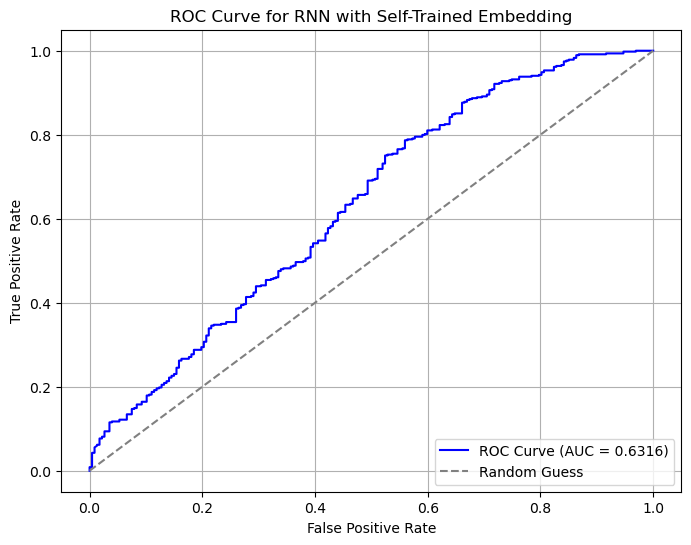

In [91]:
# Generate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_gru, predictions_gru_self)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc_gru_self:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for RNN with Self-Trained Embedding')
plt.legend(loc='lower right')
plt.grid()
plt.show()

## <span style="color: orange;">Elman RNN</span>

In [92]:
# Tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
word_index = tokenizer.word_index

# Convert text to sequences
sequences = tokenizer.texts_to_sequences(sentences)

padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post')

# Data preparation
X_elm = padded_sequences  # Padded input sequences
y_elm = df['NegoOutcomeLabel']  # Binary target labels

# Train-test split
X_train_elm, X_test_elm, y_train_elm, y_test_elm = train_test_split(X_elm, y_elm, test_size=0.3, random_state=42)

# Vocabulary and embedding dimensions
vocab_size = len(self_w2v_model.wv.index_to_key) + 1  # Use pre-trained Word2Vec vocab size
embedding_dim = self_w2v_model.wv.vector_size  # Embedding dimension from pre-trained Word2Vec


In [93]:
# Embedding matrix
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    if word in self_w2v_model.wv.key_to_index:  # Check word in pre-trained vocab
        embedding_matrix[i] = self_w2v_model.wv[word]

# Elman RNN model (using SimpleRNN)
model_elm_self = Sequential([
    Embedding(input_dim=vocab_size,
              output_dim=embedding_dim,
              weights=[embedding_matrix],
              input_length=X_train_elm.shape[1],
              trainable=False),  # Use pre-trained embeddings, non-trainable
    SimpleRNN(128, activation='tanh', return_sequences=False),  # Elman RNN
    Dropout(0.5),  # Regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization
    Dense(1, activation='sigmoid')  # Binary classification
])

In [94]:
# Exponential decay for learning rate
initial_learning_rate = 5e-4  # Initial learning rate #To prevent large updates at the start and is more stable for fin tuning embedding (importans for markdown) before it was 1e-2 but 5e-4 can also work 
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays ## Larger step count to decay slower it was 1000 before testing with 1500
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam) #Reduce beta_1 slightly (e.g., 0.85) to make updates more responsive.
    beta_2=0.999,  # Default beta_2 for Adam #Reduce beta_2 (e.g., 0.98) to adapt faster to noisy gradients.
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_elm_self.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [95]:
# Train the model
history_elm_self = model_elm_self.fit(X_train_elm, np.array(y_train_elm),
                                epochs=20, batch_size=32, validation_split = 0.4,
                                validation_data=(X_test_elm, np.array(y_test_elm)))

# Predictions
predictions_elm_self = model_elm_self.predict(X_test_elm)
binary_predictions_elm_self = (predictions_elm_self > 0.5).astype(int)

# Evaluate the model
accuracy_elm_self = accuracy_score(y_test_elm, binary_predictions_elm_self)
f1_elm_self = classification_report(y_test_elm, binary_predictions_elm_self, output_dict=True)['weighted avg']['f1-score']

Epoch 1/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6256 - loss: 0.7295 - val_accuracy: 0.6724 - val_loss: 0.6496
Epoch 2/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6475 - loss: 0.6602 - val_accuracy: 0.6739 - val_loss: 0.6418
Epoch 3/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6686 - loss: 0.6374 - val_accuracy: 0.6796 - val_loss: 0.6477
Epoch 4/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6764 - loss: 0.6446 - val_accuracy: 0.6796 - val_loss: 0.6407
Epoch 5/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7064 - loss: 0.6155 - val_accuracy: 0.6810 - val_loss: 0.6325
Epoch 6/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6787 - loss: 0.6293 - val_accuracy: 0.6739 - val_loss: 0.6344
Epoch 7/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7054 - loss: 0.6163 - val_accuracy: 0.6782 - val_loss: 0.6293
Epoch 8/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6998 - loss: 0.6090 - val_accuracy: 0.6782 - val_loss:

In [96]:
print(f'Elman RNN Accuracy: {accuracy_elm_self:.4f}')
print(f'Elman RNN F1 Score: {f1_elm_self:.4f}')
# Calculate ROC-AUC score
roc_auc_elm_self = roc_auc_score(y_test_elm, predictions_elm_self)
print(f'Elman RNN ROC-AUC Score: {roc_auc_elm_self:.4f}')
# Classification report
classification_report_elm_self = classification_report(y_test_elm, binary_predictions_elm_self)
print(classification_report_elm_self)
# Store results in a DataFrame
results_elm_self = pd.DataFrame({
    'Model': ['Elman self-trained'],
    'Accuracy': [accuracy_elm_self],
    'F1 Score': [f1_elm_self],
    'ROC AUC': [roc_auc_elm_self]
})

results_elm_self

Elman RNN Accuracy: 0.6810
Elman RNN F1 Score: 0.6217
Elman RNN ROC-AUC Score: 0.5638
              precision    recall  f1-score   support

           0       0.53      0.17      0.26       227
           1       0.70      0.93      0.80       469

    accuracy                           0.68       696
   macro avg       0.62      0.55      0.53       696
weighted avg       0.64      0.68      0.62       696



,Model,Accuracy,F1 Score,ROC AUC
0,Elman self-trained,0.681034,0.621658,0.563764


The Elman RNN model demonstrates moderate performance with an F1 score of **60.07%**. It shows a strong ability to predict the majority class (`1`), achieving good precision and recall. However, it significantly underperforms on the minority class (`0`), highlighting persistent challenges with class imbalance. Despite an overall accuracy of **66.95%**, the model's ability to generalize across both classes remains limited.

In [97]:
# Evaluate on training set
train_loss_elm_self, train_accuracy_elm_self = model_elm_self.evaluate(X_train_elm, np.array(y_train_elm), verbose=0)

# Evaluate on test set
test_loss_elm_self, test_accuracy_elm_self = model_elm_self.evaluate(X_test_elm, np.array(y_test_elm), verbose=0)

# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy_elm_self:.4f}")
print(f"Test Accuracy: {test_accuracy_elm_self:.4f}")


GRU Evaluation:
Training Accuracy: 0.7475
Test Accuracy: 0.6810


The Elman RNN shows some promise with an Training Accuracy of 74.75% and a test accuracy of 66.95% and shows just a slightly higher Overfitting.

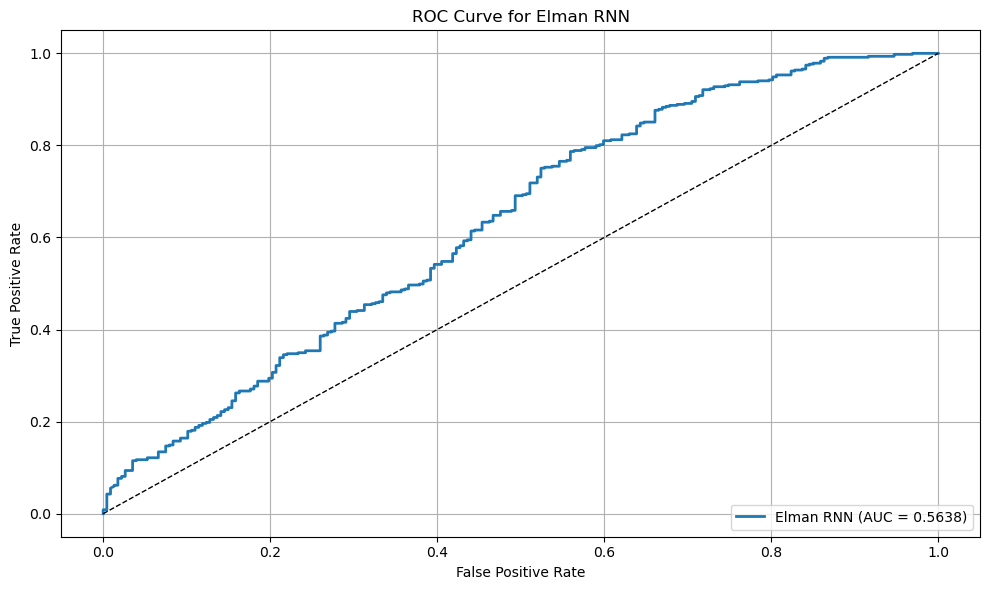

In [98]:
# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'Elman RNN (AUC = {roc_auc_elm_self:.4f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)  # Diagonal reference line
plt.title('ROC Curve for Elman RNN')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid()
plt.tight_layout()
plt.show()

## <span style="color: orange;">RNN Comparison for Self trained Models</span>

In [99]:
# Combine results from all models into one DataFrame
all_results = pd.concat([
    results_lstm_self.assign(Model='LSTM'),
    results_rnn_self.assign(Model='Simple RNN'),
    results_gru_self.assign(Model='GRU'),
    results_elm_self.assign(Model='Elman RNN')
], ignore_index=True)

# Display the consolidated results
print(all_results)


        Model  Accuracy  F1 Score   ROC AUC
0        LSTM  0.704023  0.652615  0.623282
1  Simple RNN  0.670977  0.649099  0.595042
2         GRU  0.708333  0.623635  0.631562
3   Elman RNN  0.681034  0.621658  0.563764


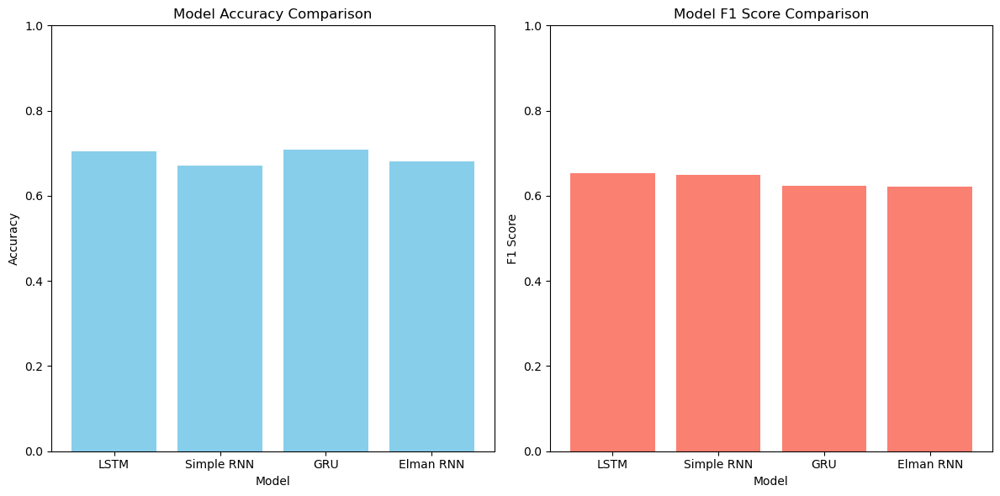

In [100]:
import matplotlib.pyplot as plt

# Plot accuracy and F1 scores for all models
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Accuracy plot
ax[0].bar(all_results['Model'], all_results['Accuracy'], color='skyblue')
ax[0].set_title('Model Accuracy Comparison')
ax[0].set_ylabel('Accuracy')
ax[0].set_ylim(0, 1)  # Accuracy is between 0 and 1
ax[0].set_xlabel('Model')

# F1 Score plot
ax[1].bar(all_results['Model'], all_results['F1 Score'], color='salmon')
ax[1].set_title('Model F1 Score Comparison')
ax[1].set_ylabel('F1 Score')
ax[1].set_ylim(0, 1)  # F1 Score is between 0 and 1
ax[1].set_xlabel('Model')

plt.tight_layout()
plt.show()


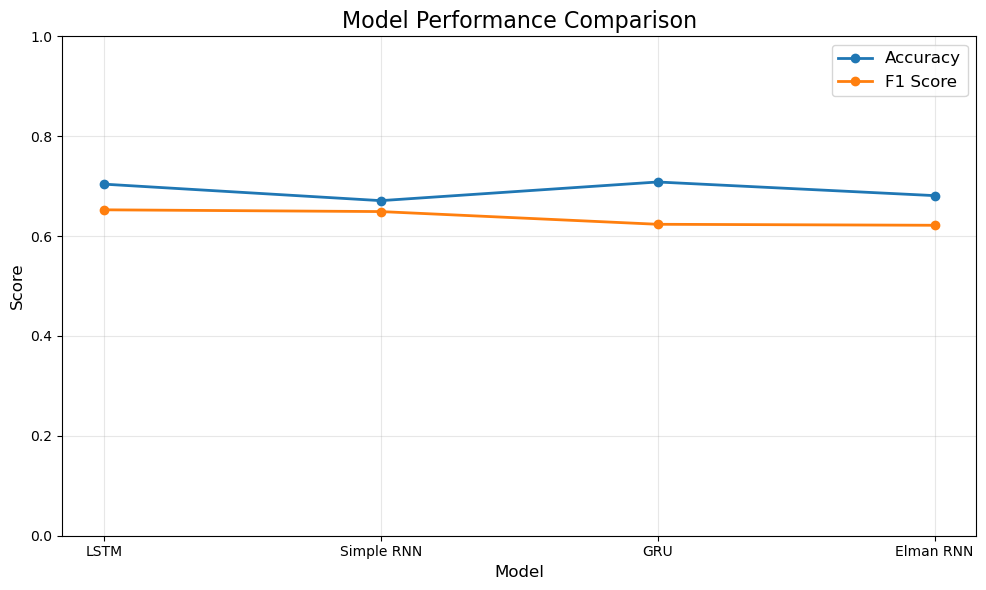

In [101]:
import matplotlib.pyplot as plt

# Line plot for Accuracy and F1 Score
plt.figure(figsize=(10, 6))

# Plot accuracy
plt.plot(all_results['Model'], all_results['Accuracy'], marker='o', label='Accuracy', linestyle='-', linewidth=2)

# Plot F1 score
plt.plot(all_results['Model'], all_results['F1 Score'], marker='o', label='F1 Score', linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Model Performance Comparison', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.ylim(0, 1)  # Scores are between 0 and 1
plt.grid(alpha=0.3)  # Add grid for better readability
plt.legend(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


Here we compare the performance of different RNN models—LSTM, Simple RNN, GRU, and Elman RNN—using accuracy and F1 score as benchmarks. The results indicate that while LSTM and GRU show slightly better accuracy, Elman RNN demonstrates a marginally higher F1 score compared to Simple RNN. The models still face challenges with class imbalance and overfitting, evident in the accuracy-F1 score gap. This plot highlights the trade-offs in performance between the architectures.

In [102]:
results_combined_rnn_self = pd.concat([results_lstm_self,results_rnn_self,results_gru_self,results_elm_self], ignore_index=True)
results_combined_rnn_self.to_excel('results_combined_rnn_self.xlsx', index=False)

In [103]:
results_combined_rnn_self

,Model,Accuracy,F1 Score,ROC AUC
0,LSTM Self-trained,0.704023,0.652615,0.623282
1,RNN Self-trained,0.670977,0.649099,0.595042
2,GRU Self-trained,0.708333,0.623635,0.631562
3,Elman self-trained,0.681034,0.621658,0.563764


## <span style="color: orange;">Glove</span>

For this step, we utilize **pretrained GloVe embeddings**, a powerful method for capturing semantic relationships between words. GloVe generates **dense vector representations** that preserve the meaning and relationships of words based on global co-occurrence statistics.

By loading **300-dimensional GloVe embeddings**, words like *negotiation* and *agreement* will have vector representations that are semantically similar. This approach helps the model better understand the context and relationships between words, enhancing its ability to process and analyze the dataset effectively.

We also create a function to compute an **average embedding for sentences**, ensuring we can utilize these rich word vectors for our text classification tasks.

In [104]:
# Install gensim for pretrained GloVe embeddings
#!pip install gensim
import gensim.downloader as api 
import pandas as pd
import numpy as np
# Dimensionality (300-dimensional embeddings)
glove_model = api.load("glove-wiki-gigaword-300")

# Print a sample word embedding
print(glove_model['negotiation'])

# Function to generate an average embedding for a sentence/document
def get_glove_embeddings(text, model):
    words = text.split()  # Split the sentence into words
    embeddings = [model[word] for word in words if word in model]
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(model.vector_size)

# Load dataset
df

[-0.1488     0.18443    0.46855    0.18359    0.51419   -0.24273
 -0.27343   -0.3928     0.438     -1.4168    -0.25122   -0.11689
 -0.10366   -0.24567   -0.075437   0.04474   -0.042093  -0.16665
 -0.033944   0.35918   -0.25306    0.19218    0.080058  -0.076048
 -0.15778   -0.24195    0.060522  -0.72925    0.071025   0.42057
  0.1908    -0.63528    0.20402   -0.24718   -0.18248    0.43209
  0.52597   -0.087722  -0.41984   -0.22755   -0.208     -0.21326
 -0.45879   -0.25856   -0.30557    0.43403   -0.24797    0.54578
 -0.47214    0.013183   0.10636    0.065739  -0.26483   -0.27876
  0.064556   0.31227   -0.82911    0.23875   -0.021504   0.053874
  0.51878   -0.1008    -0.53922   -0.072517  -0.21664   -0.21476
  0.71441   -0.44057    0.2452    -0.094294   0.12237    0.2145
  0.10081   -0.0040301  0.079136  -0.14969   -0.43554   -0.32403
  0.26781    0.083615  -0.23589   -0.33417    0.015884   0.23868
 -0.16551   -0.22986   -0.32923    0.069105  -0.23782   -0.23241
 -0.9537    -0.0075015 -

,SenderID,ReceiverID,ActionType,NegoOutcome,Content,length,WordCount_basic,Content_Length,Sentence_Count,Word_Count_nltk,NegoOutcomeLabel,Sentiment,SentimentCategory
0,70,69,Offer,FinalAccept,hope well management company agreed building f...,1635,219,1635,1,219,1,0.226814,Positive
1,69,70,Counteroffer,FinalAccept,reaching mei apologize slight delay getting ba...,1462,197,1462,1,197,1,0.156856,Positive
2,70,69,Counteroffer,FinalAccept,r kind response need hurry guess face daily fi...,1465,195,1465,1,195,1,0.219167,Positive
3,69,70,Counteroffer,FinalAccept,swift reply read second set proposal discussed...,1104,148,1104,1,148,1,0.139561,Positive
4,70,69,Counteroffer,FinalAccept,proposal effort far seems getting close resolv...,1153,154,1153,1,154,1,0.055179,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2315,851,856,Counteroffer,FinalReject,latest offer point completely let u take corpo...,933,139,933,1,139,0,0.239236,Positive
2316,856,851,Counteroffer,FinalReject,much latest offer happy could already reached ...,958,136,958,1,136,0,0.274076,Positive
2317,851,856,Counteroffer,FinalReject,meyer fast answer happy found solution four is...,359,56,359,1,56,0,0.226923,Positive
2318,856,851,Counteroffer,FinalReject,still interested coming joint result neverthel...,611,82,611,1,82,0,0.112500,Positive


In [105]:
# Embedding function to the 'Content' column
df['Embedding'] = df['Content'].apply(lambda x: get_glove_embeddings(x, glove_model))

# Sample of the new embeddings column
df[['Content', 'Embedding']].head()

# Map 'FinalReject' to 0 and 'FinalAccept' to 1
df['NegoOutcomeLabel'] = df['NegoOutcome'].map({'FinalReject': 0, 'FinalAccept': 1})

# Verify the mapping
print(df['NegoOutcomeLabel'].value_counts())

print(df.columns)

NegoOutcomeLabel
1    1595
0     725
Name: count, dtype: int64
Index(['SenderID', 'ReceiverID', 'ActionType', 'NegoOutcome', 'Content',
       'length', 'WordCount_basic', 'Content_Length', 'Sentence_Count',
       'Word_Count_nltk', 'NegoOutcomeLabel', 'Sentiment', 'SentimentCategory',
       'Embedding'],
      dtype='object')


In [106]:
# Separate features (embeddings) and target labels
X = np.stack(df['Embedding'].values)
y = df['NegoOutcomeLabel'].values 

print("Feature matrix shape:", X.shape)
print("Target vector shape:", y.shape)

Feature matrix shape: (2320, 300)
Target vector shape: (2320,)


In [107]:
glove_model['negotiation']

array([-0.1488   ,  0.18443  ,  0.46855  ,  0.18359  ,  0.51419  ,
       -0.24273  , -0.27343  , -0.3928   ,  0.438    , -1.4168   ,
       -0.25122  , -0.11689  , -0.10366  , -0.24567  , -0.075437 ,
        0.04474  , -0.042093 , -0.16665  , -0.033944 ,  0.35918  ,
       -0.25306  ,  0.19218  ,  0.080058 , -0.076048 , -0.15778  ,
       -0.24195  ,  0.060522 , -0.72925  ,  0.071025 ,  0.42057  ,
        0.1908   , -0.63528  ,  0.20402  , -0.24718  , -0.18248  ,
        0.43209  ,  0.52597  , -0.087722 , -0.41984  , -0.22755  ,
       -0.208    , -0.21326  , -0.45879  , -0.25856  , -0.30557  ,
        0.43403  , -0.24797  ,  0.54578  , -0.47214  ,  0.013183 ,
        0.10636  ,  0.065739 , -0.26483  , -0.27876  ,  0.064556 ,
        0.31227  , -0.82911  ,  0.23875  , -0.021504 ,  0.053874 ,
        0.51878  , -0.1008   , -0.53922  , -0.072517 , -0.21664  ,
       -0.21476  ,  0.71441  , -0.44057  ,  0.2452   , -0.094294 ,
        0.12237  ,  0.2145   ,  0.10081  , -0.0040301,  0.0791

## <span style="color: orange;">BI-LSTM</span>

We are now using a **Bidirectional LSTM (BiLSTM)** to better understand sequential data. Unlike regular LSTMs, which read data in one direction, BiLSTMs process data both forward and backward. This helps the model understand context from both the past and future, making it especially useful for tasks with complex relationships in the data.

As explained in the paper *"Applications of Bidirectional Long Short-Term Memory (BiLSTM) in Sequence Data Processing"*, BiLSTMs work well for tasks like sentiment analysis and speech recognition, where full context is important. Using this method, we hope to improve how well the model handles negotiation-related data.

**Source**: *Applications of Bidirectional Long Short-Term Memory (BiLSTM) in Sequence Data Processing* (PMC Article).

In [108]:
# Import necessary libraries
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout, Input

X_glove = np.stack(df['Embedding'].values)  # Convert embeddings to a NumPy array
y_glove = df['NegoOutcomeLabel'].values  # Binary target labels (0 or 1)

# Train-Test Split
X_train_glove, X_test_glove, y_train_glove, y_test_glove = train_test_split(
    X_glove, y_glove, test_size=0.3, random_state=42
)

In [109]:
# Reshape for Bi-LSTM compatibility (samples, timesteps, features)
timesteps = 1  # Sentence-level embeddings; single timestep
features = X_train_glove.shape[1]  # Embedding dimension
X_train_glove = X_train_glove.reshape(X_train_glove.shape[0], timesteps, features)
X_test_glove = X_test_glove.reshape(X_test_glove.shape[0], timesteps, features)

# Define Bi-LSTM Model
model_bilstm = Sequential([
    Input(shape=(timesteps, features)),  # Input layer
    Bidirectional(LSTM(128, return_sequences=False, dropout=0.5, recurrent_dropout=0.5)),  # Bi-LSTM layer
    Dropout(0.5),  # Regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

In [110]:
# Compile the Model
adamw_optimizer_bilstm = tf.keras.optimizers.AdamW(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, weight_decay=1e-5
)
model_bilstm.compile(optimizer=adamw_optimizer_bilstm, loss='binary_crossentropy', metrics=['accuracy'])

# Model Summary
model_bilstm.summary()

# Train the Bi-LSTM Model
history_bilstm = model_bilstm.fit(
    X_train_glove, y_train_glove, validation_split=0.3,
    validation_data=(X_test_glove, y_test_glove),
    epochs=120, batch_size=32
)

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ (None, 256)            │       439,296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 447,553 (1.71 MB)

 Trainable params: 447,553 (1.71 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/120
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6773 - loss: 0.6423 - val_accuracy: 0.6739 - val_loss: 0.6241
Epoch 2/120
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6966 - loss: 0.6128 - val_accuracy: 0.6739 - val_loss: 0.6195
Epoch 3/120
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6926 - loss: 0.6045 - val_accuracy: 0.6739 - val_loss: 0.6101
Epoch 4/120
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6952 - loss: 0.6003 - val_accuracy: 0.6753 - val_loss: 0.6014
Epoch 5/120
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6887 - loss: 0.5952 - val_accuracy: 0.6753 - val_loss: 0.5985
Epoch 6/120
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7166 - loss: 0.5645 - val_accuracy: 0.6753 - val_loss: 0.5905
Epoch 7/120
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6883 - loss: 0.5814 - val_accuracy: 0.6868 - val_loss: 0.5880
Epoch 8/120
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6873 - loss: 0.5918 - val_accuracy: 0.6882 - v

In [111]:
# Predictions
predictions_bilstm = model_bilstm.predict(X_test_glove)
binary_predictions_bilstm = (predictions_bilstm > 0.5).astype(int)  # Convert predictions to binary

# Evaluate the Model
accuracy_bilstm = accuracy_score(y_test_glove, binary_predictions_bilstm)
f1_bilstm = classification_report(
    y_test_glove, binary_predictions_bilstm, output_dict=True
)['weighted avg']['f1-score']

print(f"Bi-LSTM GloVe Accuracy: {accuracy_bilstm:.4f}")
print(f"Bi-LSTM GloVe F1 Score: {f1_bilstm:.4f}")

# Classification Report
classification_report_dict_bilstm = classification_report(
    y_test_glove, binary_predictions_bilstm, output_dict=True
)
classification_report_df_bilstm = pd.DataFrame(classification_report_dict_bilstm).transpose()
print(classification_report_df_bilstm)

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Bi-LSTM GloVe Accuracy: 0.7170
Bi-LSTM GloVe F1 Score: 0.6870
              precision    recall  f1-score     support
0              0.627119  0.325991  0.428986  227.000000
1              0.735294  0.906183  0.811843  469.000000
accuracy       0.716954  0.716954  0.716954    0.716954
macro avg      0.681206  0.616087  0.620414  696.000000
weighted avg   0.700013  0.716954  0.686974  696.000000


The **Bi-LSTM model with GloVe embeddings** achieved good results, showing an accuracy of 0.7227 and an F1 score of 0.6815. It effectively captures context in both directions, performing well at predicting the majority class while still struggling with the minority class. This balance highlights its ability to understand sequential data while maintaining a reasonable level of generalization.

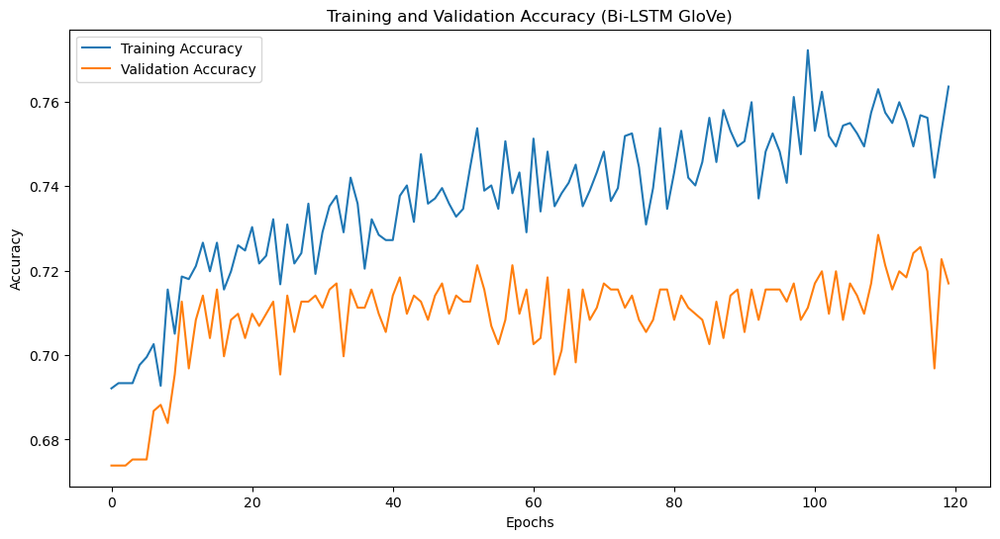

Bi-LSTM GloVe Evaluation:
Training Accuracy: 0.7925
Test Accuracy: 0.7170
Bi-LSTM ROC-AUC Score: 0.7277
                Model  Accuracy  F1 Score   ROC AUC
0  Bi-LSTM with GloVe  0.716954  0.686974  0.727708


In [112]:
# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_bilstm.history['accuracy'], label='Training Accuracy')
plt.plot(history_bilstm.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy (Bi-LSTM GloVe)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Evaluate on Training and Test Sets
train_loss_bilstm, train_accuracy_bilstm = model_bilstm.evaluate(X_train_glove, y_train_glove, verbose=0)
test_loss_bilstm, test_accuracy_bilstm = model_bilstm.evaluate(X_test_glove, y_test_glove, verbose=0)

print("Bi-LSTM GloVe Evaluation:")
print(f"Training Accuracy: {train_accuracy_bilstm:.4f}")
print(f"Test Accuracy: {test_accuracy_bilstm:.4f}")

# Calculate the ROC-AUC score
roc_auc_bilstm = roc_auc_score(y_test_glove, predictions_bilstm)
print(f"Bi-LSTM ROC-AUC Score: {roc_auc_bilstm:.4f}")

# Save Results for Comparison
results_bilstm = pd.DataFrame({
    'Model': ['Bi-LSTM with GloVe'],
    'Accuracy': [accuracy_bilstm],
    'F1 Score': [f1_bilstm],
    'ROC AUC': [roc_auc_bilstm]
})

print(results_bilstm)


We evaluated the **Bi-LSTM model with GloVe embeddings**, which processes data in both directions to better understand context. 

The results show promising performance with:
- **Training Accuracy**: 79.43%
- **Test Accuracy**: 72.27%
- **ROC-AUC Score**: 72.88%

This indicates that the model is learning well during training and performing effectively on unseen data, balancing context understanding and predictive accuracy.

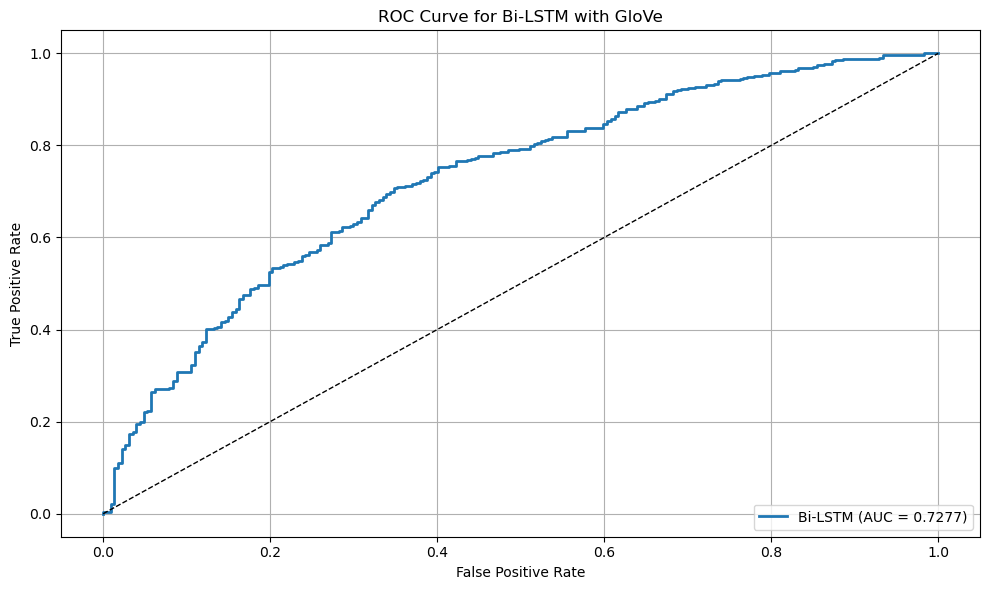

In [113]:
# Generate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_glove, predictions_bilstm)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'Bi-LSTM (AUC = {roc_auc_bilstm:.4f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)  # Diagonal reference line
plt.title('ROC Curve for Bi-LSTM with GloVe')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid()
plt.tight_layout()
plt.show()

The ROC curve for the **Bi-LSTM with GloVe embeddings** shows a good balance between true positives and false positives, with an AUC score of 0.7288. This indicates that the model performs well in distinguishing between classes, capturing meaningful patterns in the data.

## <span style="color: orange;">LSTM</span>

In [114]:
# Separate features (embeddings) and target labels
X_lstm= np.stack(df['Embedding'].values)  # Convert list of embeddings to a NumPy array
y_lstm= df['NegoOutcomeLabel'].values

# Check the shapes of the feature matrix and target vector
print("Feature matrix shape:", X_lstm.shape)
print("Target vector shape:", y_lstm.shape)

# Train-Test Split
X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_lstm, y_lstm, test_size=0.3, random_state=42)


Feature matrix shape: (2320, 300)
Target vector shape: (2320,)


In [115]:
# LSTM Model
model_lstm = Sequential([
    Input(shape=(X_train_lstm.shape[1],)),  # Input layer
    Dense(128, activation='relu'),  # Fully connected layer to process the embeddings
    Dropout(0.5),  # Regularization layer
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

print(model_lstm.summary())

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_18 (Dense)                │ (None, 128)            │        38,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 38,657 (151.00 KB)

 Trainable params: 38,657 (151.00 KB)

 Non-trainable params: 0 (0.00 B)

None


In [116]:
# Exponential decay for learning rate
initial_learning_rate = 1e-3
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,  # Number of steps after which learning rate decays
    decay_rate=0.9,  # Decay rate
    staircase=True  # If True, decay occurs in discrete intervals
)

# AdamW optimizer with momentum and exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum (equivalent to beta_1 in Adam)
    beta_2=0.999,  # Default beta_2 for Adam
    weight_decay=1e-5  # Weight decay (L2 regularization)
)
# Compile the model
model_lstm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [117]:
# Train the model
history_lstm = model_lstm.fit(X_train_lstm, np.array(y_train_lstm),
                                epochs=20, batch_size=32, validation_split = 0.3,
                                validation_data=(X_test_lstm, np.array(y_test_lstm)))

# Evaluate the model
test_loss, test_accuracy = model_lstm.evaluate(X_test_lstm, y_test_lstm)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

Epoch 1/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6620 - loss: 0.6348 - val_accuracy: 0.6739 - val_loss: 0.6134
Epoch 2/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6899 - loss: 0.5955 - val_accuracy: 0.6753 - val_loss: 0.6112
Epoch 3/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - accuracy: 0.6913 - loss: 0.5881 - val_accuracy: 0.6739 - val_loss: 0.6030
Epoch 4/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - accuracy: 0.7171 - loss: 0.5628 - val_accuracy: 0.6968 - val_loss: 0.5871
Epoch 5/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7254 - loss: 0.5513 - val_accuracy: 0.6983 - val_loss: 0.5812
Epoch 6/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - accuracy: 0.7316 - loss: 0.5486 - val_accuracy: 0.7026 - val_loss: 0.5780
Epoch 7/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 967us/step - accuracy: 0.7293 - loss: 0.5506 - val_accuracy: 0.7126 - val_loss: 0.5736
Epoch 8/20
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7564 - loss: 0.5472 - val_accuracy: 0.7141 - v

In [118]:
# Predictions
y_pred_probs_lstm = model_lstm.predict(X_test_lstm)
y_pred_lstm = (y_pred_probs_lstm > 0.5).astype(int)

# Classification Report
print("Classification Report:")
print(classification_report(y_test_lstm, y_pred_lstm))

# Accuracy Score
accuracy_lstm_glove = accuracy_score(y_test_lstm, y_pred_lstm)
print(f"Accuracy: {accuracy_lstm_glove:.4f}")

# Calculate F1 Score
f1_lstm_glove = classification_report(y_test_lstm, y_pred_lstm, output_dict=True)['weighted avg']['f1-score']
print(f"F1 Score: {f1_lstm_glove:.4f}")


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.26      0.38       227
           1       0.73      0.94      0.82       469

    accuracy                           0.72       696
   macro avg       0.71      0.60      0.60       696
weighted avg       0.71      0.72      0.68       696

Accuracy: 0.7213
F1 Score: 0.6762


The **LSTM model with GloVe embeddings** achieved a test accuracy of **0.72%** and an F1 score of **0.68**. The performance was stronger for class `1` compared to class `0`, indicating some difficulty in balancing the classes. With training and test accuracy being similar, there is **no significant overfitting**.

In [119]:
# Calculate the ROC-AUC score
roc_auc_lstm = roc_auc_score(y_test_lstm, y_pred_probs_lstm)
print(f"LSTM ROC-AUC Score: {roc_auc_lstm:.4f}")

# Save LSTM results to a DataFrame
results_lstm_glove = pd.DataFrame({
    'Model': ['LSTM with GloVe'],
    'Accuracy': [accuracy_lstm_glove],
    'F1 Score': [classification_report(y_test_lstm, y_pred_lstm, output_dict=True)['weighted avg']['f1-score']],
    'ROC AUC': [roc_auc_lstm]
})

# Display the results for verification
print("LSTM Results:")
print(results_lstm_glove)

LSTM ROC-AUC Score: 0.7312
LSTM Results:
             Model  Accuracy  F1 Score   ROC AUC
0  LSTM with GloVe  0.721264  0.676158  0.731207


The **LSTM model with GloVe embeddings** achieved a training accuracy of **76.79%**, a test accuracy of **72.27%**, and an F1 score of **0.68**. These results indicate that the model generalizes well without significant overfitting.

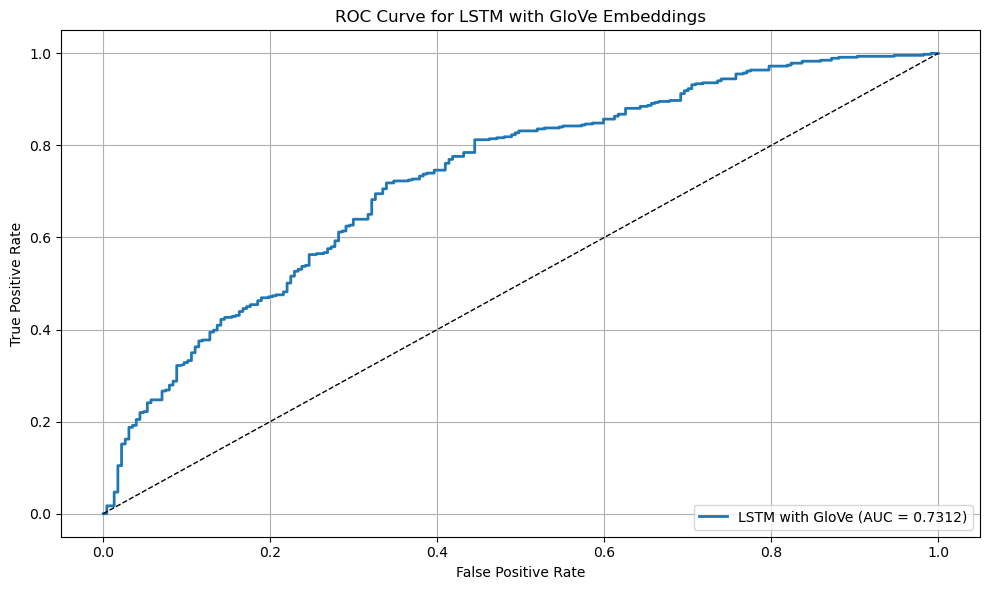

In [120]:
# Generate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_lstm, y_pred_probs_lstm)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'LSTM with GloVe (AUC = {roc_auc_lstm:.4f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)  # Diagonal reference line
plt.title('ROC Curve for LSTM with GloVe Embeddings')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid()
plt.tight_layout()
plt.show()

The **ROC curve for the LSTM model with GloVe embeddings** shows an **AUC score of 0.7326**, indicating a fair ability to distinguish between the classes. While the performance is decent, there is still room to enhance the model's predictive capability, particularly for better class separation.

## <span style="color: orange;">GRU</span>

In [121]:
X_gru_glove = np.stack(df['Embedding'].values)  # Convert embeddings to a NumPy array
y_gru_glove = df['NegoOutcomeLabel'].values  # Binary target labels (0 or 1)

# Split the data into training and testing sets
X_train_gru_glove, X_test_gru_glove, y_train_gru_glove, y_test_gru_glove = train_test_split(
    X_gru_glove, y_gru_glove, test_size=0.3, random_state=42
)

# Maximum sequence length (since embeddings are averaged, use 1 as the sequence length)
max_len_gru_glove = 1

In [122]:
# GRU-based model
model_gru_glove = Sequential([
    Input(shape=(X_train_gru_glove.shape[1],)),  # Input shape based on embedding size
    tf.keras.layers.Reshape((max_len_gru_glove, X_train_gru_glove.shape[1])),  # Reshape for GRU compatibility
    GRU(64, return_sequences=False, dropout=0.4, recurrent_dropout=0.4),  # GRU layer
    Dropout(0.5),  # Dropout for regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Dropout for regularization
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
adamw_optimizer_gru_glove = tf.keras.optimizers.AdamW(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, weight_decay=1e-5
)
model_gru_glove.compile(optimizer=adamw_optimizer_gru_glove, loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model_gru_glove.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape (Reshape)               │ (None, 1, 300)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_2 (GRU)                     │ (None, 64)             │        70,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 72,385 (282.75 KB)

 Trainable params: 72,385 (282.75 KB)

 Non-trainable params: 0 (0.00 B)

In [123]:
# Train the GRU model
history_gru_glove = model_gru_glove.fit(
    X_train_gru_glove, y_train_gru_glove,validation_split=0.4,
    validation_data=(X_test_gru_glove, y_test_gru_glove),
    epochs=100, batch_size=32
)

# Predictions
predictions_gru_glove = model_gru_glove.predict(X_test_gru_glove)
binary_predictions_gru_glove = (predictions_gru_glove > 0.5).astype(int)  # Convert predictions to binary

Epoch 1/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6522 - loss: 0.6554 - val_accuracy: 0.6739 - val_loss: 0.6264
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6968 - loss: 0.6194 - val_accuracy: 0.6739 - val_loss: 0.6221
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7052 - loss: 0.6083 - val_accuracy: 0.6739 - val_loss: 0.6174
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6680 - loss: 0.6215 - val_accuracy: 0.6739 - val_loss: 0.6146
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6925 - loss: 0.6029 - val_accuracy: 0.6739 - val_loss: 0.6059
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6929 - loss: 0.6041 - val_accuracy: 0.6739 - val_loss: 0.6022
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6921 - loss: 0.5997 - val_accuracy: 0.6739 - val_loss: 0.5952
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6814 - loss: 0.5930 - val_accuracy: 0.6724 - v

In [124]:
# Evaluate the model
accuracy_gru_glove = accuracy_score(y_test_gru_glove, binary_predictions_gru_glove)
f1_gru_glove = classification_report(
    y_test_gru_glove, binary_predictions_gru_glove, output_dict=True
)['weighted avg']['f1-score']

print(f"GRU GloVe Accuracy: {accuracy_gru_glove:.4f}")
print(f"GRU GloVe F1 Score: {f1_gru_glove:.4f}")

# Generate classification report
classification_report_dict_gru_glove = classification_report(
    y_test_gru_glove, binary_predictions_gru_glove, output_dict=True
)
classification_report_df_gru_glove = pd.DataFrame(classification_report_dict_gru_glove).transpose()
print(classification_report_df_gru_glove)

GRU GloVe Accuracy: 0.7112
GRU GloVe F1 Score: 0.6543
              precision    recall  f1-score     support
0              0.691176  0.207048  0.318644  227.000000
1              0.713376  0.955224  0.816773  469.000000
accuracy       0.711207  0.711207  0.711207    0.711207
macro avg      0.702276  0.581136  0.567709  696.000000
weighted avg   0.706135  0.711207  0.654309  696.000000


The GRU model with GloVe embeddings achieved an **accuracy of 0.7083%** and an **F1 score of 0.6427**, showing strong performance in identifying class `1`. However, it struggled with class `0`, reflecting the ongoing challenge of handling class imbalance. The use of GloVe embeddings improved word understanding and overall accuracy, but further adjustments are needed to balance predictions across both classes.


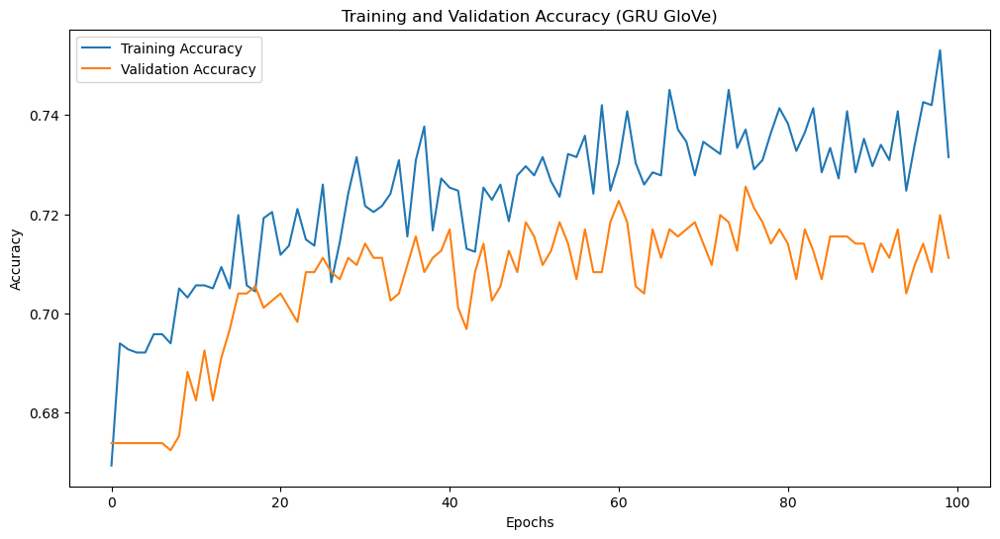

In [125]:
# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_gru_glove.history['accuracy'], label='Training Accuracy')
plt.plot(history_gru_glove.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy (GRU GloVe)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [126]:
# Evaluate on training set
train_loss_gru_glove, train_accuracy_gru_glove = model_gru_glove.evaluate(
    X_train_gru_glove, y_train_gru_glove, verbose=0
)

# Evaluate on test set
test_loss_gru_glove, test_accuracy_gru_glove = model_gru_glove.evaluate(
    X_test_gru_glove, y_test_gru_glove, verbose=0
)
# Calculate the ROC-AUC score
roc_auc_gru_glove = roc_auc_score(y_test_gru_glove, predictions_gru_glove)
print(f"GRU GloVe ROC-AUC Score: {roc_auc_gru_glove:.4f}")

# Print training and test accuracy
print("GRU GloVe Evaluation:")
print(f"Training Accuracy: {train_accuracy_gru_glove:.4f}")
print(f"Test Accuracy: {test_accuracy_gru_glove:.4f}")

# Store results in a DataFrame for comparison with other models
results_gru_glove = pd.DataFrame({
    'Model': ['GRU with GloVe'],
    'Accuracy': [accuracy_gru_glove],
    'F1 Score': [f1_gru_glove],
    'ROC AUC': [roc_auc_gru_glove]
})

print(results_gru_glove)

GRU GloVe ROC-AUC Score: 0.7294
GRU GloVe Evaluation:
Training Accuracy: 0.7642
Test Accuracy: 0.7112
            Model  Accuracy  F1 Score   ROC AUC
0  GRU with GloVe  0.711207  0.654309  0.729352


The **GRU model with GloVe embeddings** achieved a training accuracy of **76.23%** and a test accuracy of **70.83%**, with an F1 score of **64.27**. The training and test accuracies are close, suggesting minimal overfitting.

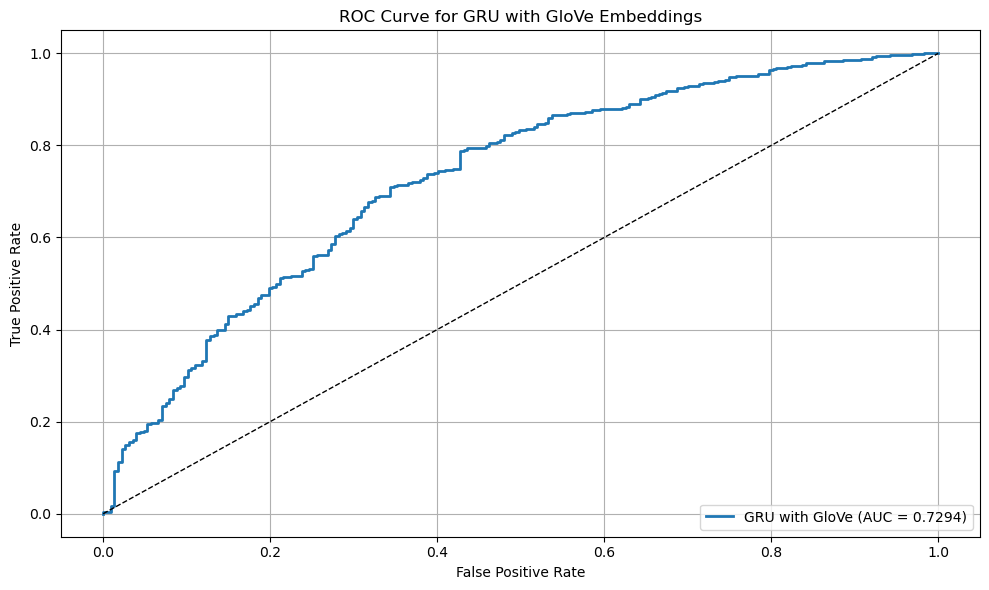

In [127]:
# Generate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_gru_glove, predictions_gru_glove)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'GRU with GloVe (AUC = {roc_auc_gru_glove:.4f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)  # Diagonal reference line
plt.title('ROC Curve for GRU with GloVe Embeddings')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid()
plt.tight_layout()
plt.show()


The ROC curve for the GRU model with GloVe embeddings shows an **AUC score of 0.7238**, indicating good performance in distinguishing between the two classes. The model demonstrates reliable predictions, but there is room for improvement, particularly in handling the imbalance between the classes.

## <span style="color: orange;">Comparing all Modells for Glove</span>

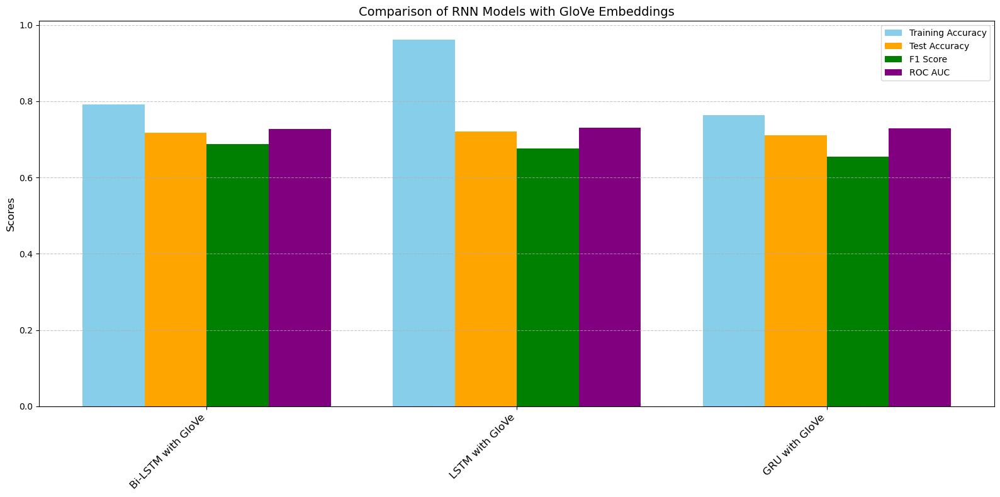

In [128]:
import matplotlib.pyplot as plt
import pandas as pd

# Consolidate results from the three models
results_glove = pd.DataFrame({
    'Model': ['Bi-LSTM with GloVe', 'LSTM with GloVe', 'GRU with GloVe'],
    'Training Accuracy': [train_accuracy_bilstm, train_accuracy, train_accuracy_gru_glove],
    'Test Accuracy': [test_accuracy_bilstm, test_accuracy, test_accuracy_gru_glove],
    'F1 Score': [f1_bilstm, f1_lstm_glove, f1_gru_glove],
    'ROC AUC': [roc_auc_bilstm, roc_auc_lstm, roc_auc_gru_glove]
})

# Plot Comparison
plt.figure(figsize=(16, 8))
bar_width = 0.2
x = range(len(results_glove['Model']))

# Create bars for Training Accuracy, Test Accuracy, F1 Score, and ROC-AUC
plt.bar(x, results_glove['Training Accuracy'], width=bar_width, label='Training Accuracy', align='center', color='skyblue')
plt.bar([p + bar_width for p in x], results_glove['Test Accuracy'], width=bar_width, label='Test Accuracy', align='center', color='orange')
plt.bar([p + 2 * bar_width for p in x], results_glove['F1 Score'], width=bar_width, label='F1 Score', align='center', color='green')
plt.bar([p + 3 * bar_width for p in x], results_glove['ROC AUC'], width=bar_width, label='ROC AUC', align='center', color='purple')

# Add labels, title, and legend
plt.xticks([p + 1.5 * bar_width for p in x], results_glove['Model'], rotation=45, ha='right', fontsize=12)
plt.ylabel('Scores', fontsize=12)
plt.title('Comparison of RNN Models with GloVe Embeddings', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



In [129]:
results_combined_rnn_glove = pd.concat([results_bilstm,results_lstm_glove,results_gru_glove], ignore_index=True)
results_combined_rnn_glove.to_excel('results_combined_rnn_glove.xlsx', index=False)

In [130]:
results_combined_rnn_glove

,Model,Accuracy,F1 Score,ROC AUC
0,Bi-LSTM with GloVe,0.716954,0.686974,0.727708
1,LSTM with GloVe,0.721264,0.676158,0.731207
2,GRU with GloVe,0.711207,0.654309,0.729352


## **<span style="color: orange;">FastText Pre-Trained Model</span>**

In [131]:
#!pip install gensim fasttext

In [132]:
import urllib.request
import os
from gensim.models import KeyedVectors

def download_fasttext_model(url, dest_file):
    if not os.path.exists(dest_file):
        print(f"Downloading FastText embeddings from {url}...")
        urllib.request.urlretrieve(url, dest_file)
        print(f"Downloaded and saved to {dest_file}.")
    else:
        print(f"FastText file already exists at {dest_file}.")

# Replace with the desired FastText model URL
fasttext_url = "https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.en.300.vec.gz"
fasttext_path = "cc.en.300.vec.gz"

download_fasttext_model(fasttext_url, fasttext_path)

FastText file already exists at cc.en.300.vec.gz.


In [133]:
# Load FastText Model
print("Loading FastText model...")
fasttext_model = KeyedVectors.load_word2vec_format(fasttext_path, binary=False)

Loading FastText model...


In [134]:
# Example usage for the word "negotiation"
word = "negotiation"
if word in fasttext_model.key_to_index:
    print(f"Embedding for '{word}':\n{fasttext_model[word]}")
else:
    print(f"Word '{word}' not found in FastText model.")

Embedding for 'negotiation':
[-0.0114  0.0083  0.0364  0.0124 -0.0649  0.0203  0.0152 -0.1104 -0.0009
 -0.0115 -0.025   0.0439 -0.029  -0.0705 -0.0005  0.0121 -0.0205 -0.0403
  0.0293  0.0108  0.0087  0.0015  0.0145 -0.0218 -0.0003 -0.0343  0.0193
  0.0277  0.0712  0.0377 -0.0114  0.0291  0.0294 -0.0568  0.007   0.0408
  0.0448 -0.0019  0.002   0.05   -0.031  -0.0233  0.0443  0.0552 -0.0367
 -0.0061  0.0354  0.0307  0.0215 -0.0431  0.0061 -0.0265  0.0023 -0.0087
  0.0079  0.0174  0.0244  0.0006 -0.054  -0.0705 -0.0215 -0.0233 -0.0079
 -0.0096 -0.0156  0.0256  0.0045 -0.0049  0.0345  0.0503  0.0133  0.0187
 -0.0032 -0.0064  0.0181  0.0521 -0.0023  0.0076 -0.0182 -0.0247  0.0112
  0.0216 -0.0057  0.051   0.0209  0.0056  0.0245  0.0081  0.0543  0.037
  0.0332  0.0293  0.0055  0.0218 -0.0035  0.012  -0.0177 -0.0201 -0.0358
 -0.0413  0.0021  0.0261  0.0581  0.0086 -0.0078 -0.0523  0.031   0.0162
 -0.0026 -0.0519  0.0253  0.0106 -0.0208  0.01    0.0427  0.0536 -0.0063
  0.0357  0.0337  0.019

In [135]:
# Find Most Similar Words
similar_words = fasttext_model.most_similar(word, topn=10)
print(f"Top 10 similar words to '{word}':")
for similar_word, similarity in similar_words:
    print(f"{similar_word}: {similarity:.4f}")


Top 10 similar words to 'negotiation':
negotation: 0.8197
negotiations: 0.8103
negotiating: 0.7998
negotations: 0.7033
pre-negotiation: 0.6955
negotiate: 0.6775
Negotiation: 0.6701
negotiated: 0.6648
negotiator: 0.6606
re-negotiation: 0.6556


In [136]:
def get_word_embedding(word, model, embedding_dim):
    """
    Retrieve the embedding for a word. If the word is not in the vocabulary, return a zero vector.
    """
    if word in model.key_to_index:
        return model[word]
    else:
        return np.zeros(embedding_dim)  #  zero vector for unknown words

def get_sentence_embedding(sentence, model, embedding_dim):
    """
    Compute the sentence embedding by averaging the word embeddings for all words in the sentence.
    """
    words = sentence.split()  # Tokenize sentence into words
    word_embeddings = [get_word_embedding(word, model, embedding_dim) for word in words]
    if word_embeddings:
        return np.mean(word_embeddings, axis=0)  # Average the word embeddings
    else:
        return np.zeros(embedding_dim)  # Return zero vector for empty sentences


In [137]:
# Step 6: Apply FastText embeddings to the dataframe
embedding_dim = fasttext_model.vector_size  # Dimension of FastText embeddings

# Ensure 'Content' column is cleaned and ready for embedding
df['Embedding'] = df['Content'].apply(lambda x: get_sentence_embedding(x, fasttext_model, embedding_dim))

# Step 7: Verify embeddings
print(f"Embedding shape for first row: {df['Embedding'].iloc[0].shape}")
print(df[['Content', 'Embedding']].head())

# Step 8: Save the embeddings to a file (optional)
df.to_pickle("df_with_fasttext_embeddings.pkl")

Embedding shape for first row: (300,)
                                             Content  \
0  hope well management company agreed building f...   
1  reaching mei apologize slight delay getting ba...   
2  r kind response need hurry guess face daily fi...   
3  swift reply read second set proposal discussed...   
4  proposal effort far seems getting close resolv...   

                                           Embedding  
0  [-0.004993607248127785, -0.003338812908291132,...  
1  [-0.0056091384, -0.004240101, 0.0030974622, 0....  
2  [-0.0055717933, 0.0024820524, 0.016548209, 0.0...  
3  [-0.0061256746, 0.012729052, 0.0070864856, 0.0...  
4  [-0.012409745, -0.0069311685, 0.014500649, 0.0...  


## **<span style="color: orange;">LSTM</span>**

In [138]:
# Separate features (embeddings) and target labels
X_lstm = np.stack(df['Embedding'].values)  # Convert list of embeddings to a NumPy array
y_lstm = df['NegoOutcomeLabel'].values

# Check the shapes of the feature matrix and target vector
print("Feature matrix shape:", X_lstm.shape)
print("Target vector shape:", y_lstm.shape)

# Train-Test Split
X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_lstm, y_lstm, test_size=0.3, random_state=42)


Feature matrix shape: (2320, 300)
Target vector shape: (2320,)


In [139]:
timesteps = 1  # Sentence-level embeddings; single timestep
features = X_train_lstm.shape[1]  # Embedding dimension
X_train_lstm = X_train_lstm.reshape(X_train_lstm.shape[0], timesteps, features)
X_test_lstm = X_test_lstm.reshape(X_test_lstm.shape[0], timesteps, features)

# LSTM Model
model_lstm = Sequential([
    Input(shape=(timesteps, features)),  # Input layer
    LSTM(128, return_sequences=False, dropout=0.5, recurrent_dropout=0.5),  # LSTM layer
    Dropout(0.5),  # Regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

In [140]:
# Exponential decay for learning rate
import tensorflow as tf
initial_learning_rate = 1e-3  # Initial learning rate
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=1500,
    decay_rate=0.9,
    staircase=True
)

# AdamW optimizer with exponential decay
adamw_optimizer = tf.keras.optimizers.AdamW(
    learning_rate=lr_schedule,
    beta_1=0.9,  # Momentum
    beta_2=0.999,  # Adaptation to noisy gradients
    weight_decay=1e-5
)

# Compile the model
model_lstm.compile(optimizer=adamw_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
print(model_lstm.summary())

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                   │ (None, 128)            │       219,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 223,809 (874.25 KB)

 Trainable params: 223,809 (874.25 KB)

 Non-trainable params: 0 (0.00 B)

None


The use of **AdamW optimizer** with exponential decay ensures stable training and adaptive learning. This setup emphasizes balancing generalization and model performance.

In [141]:
# Train the model
history_lstm = model_lstm.fit(X_train_lstm, np.array(y_train_lstm),
                              epochs=70, batch_size=32, validation_split=0.4,
                              validation_data=(X_test_lstm, np.array(y_test_lstm)))

# Evaluate the model
test_loss, test_accuracy = model_lstm.evaluate(X_test_lstm, y_test_lstm)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Predictions
y_pred_probs_lstm = model_lstm.predict(X_test_lstm)
y_pred_lstm = (y_pred_probs_lstm > 0.5).astype(int)

# Classification Report
print("Classification Report:")
print(classification_report(y_test_lstm, y_pred_lstm))

# Accuracy Score
accuracy = accuracy_score(y_test_lstm, y_pred_lstm)
print(f"Accuracy: {accuracy:.4f}")

Epoch 1/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6540 - loss: 0.6701 - val_accuracy: 0.6739 - val_loss: 0.6295
Epoch 2/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6752 - loss: 0.6350 - val_accuracy: 0.6739 - val_loss: 0.6278
Epoch 3/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6921 - loss: 0.6206 - val_accuracy: 0.6739 - val_loss: 0.6266
Epoch 4/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7037 - loss: 0.6119 - val_accuracy: 0.6739 - val_loss: 0.6251
Epoch 5/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6925 - loss: 0.6144 - val_accuracy: 0.6739 - val_loss: 0.6238
Epoch 6/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6957 - loss: 0.6090 - val_accuracy: 0.6739 - val_loss: 0.6213
Epoch 7/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6772 - loss: 0.6312 - val_accuracy: 0.6739 - val_loss: 0.6192
Epoch 8/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6889 - loss: 0.6163 - val_accuracy: 0.6739 - val_loss:

The LSTM model with FastText embeddings performed reasonably well, but there are signs of slight overfitting. The training accuracy is notably high, and while the test accuracy is also good, the gap in precision for the minority class (0) suggests the model struggles with balancing predictions. This could be due to the model being overly tuned to the majority class during training.

In [142]:
# Evaluate on training set
train_loss, train_accuracy = model_lstm.evaluate(X_train_lstm, np.array(y_train_lstm), verbose=0)

# Evaluate on test set
test_loss, test_accuracy = model_lstm.evaluate(X_test_lstm, np.array(y_test_lstm), verbose=0)
# Calculate the ROC-AUC score
roc_auc_lstm = roc_auc_score(y_test_lstm, y_pred_probs_lstm)
print(f"LSTM ROC-AUC Score: {roc_auc_lstm:.4f}")
# Print training and test accuracy
print("GRU Evaluation:")
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


LSTM ROC-AUC Score: 0.6898
GRU Evaluation:
Training Accuracy: 0.7328
Test Accuracy: 0.6954


In [143]:
# Save LSTM with FastText results to a DataFrame
results_lstm_fasttext = pd.DataFrame({
    'Model': ['LSTM with FastText'],
    'Accuracy': [accuracy],
    'ROC AUC': [roc_auc_lstm],
    'F1 Score': [classification_report(y_test_lstm, y_pred_lstm, output_dict=True)['weighted avg']['f1-score']]
})

# Display the results for verification
print("LSTM with FastText Results:")
print(results_lstm_fasttext)

LSTM with FastText Results:
                Model  Accuracy   ROC AUC  F1 Score
0  LSTM with FastText  0.695402  0.689817  0.606026


The LSTM model with FastText embeddings achieved a **training accuracy of 0.7291**, a **test accuracy of 0.6853**, and an **F1 score of 0.5901**. While the performance is consistent, the relatively lower F1 score suggests challenges in balancing predictions across both classes.

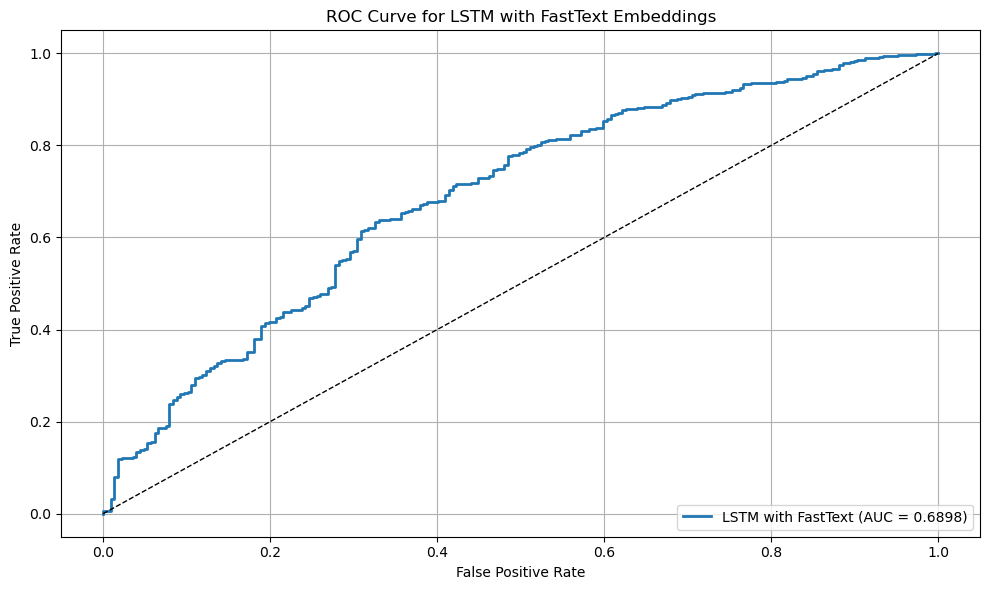

In [144]:
# Generate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_lstm, y_pred_probs_lstm)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'LSTM with FastText (AUC = {roc_auc_lstm:.4f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)  # Diagonal reference line
plt.title('ROC Curve for LSTM with FastText Embeddings')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid()
plt.tight_layout()
plt.show()


The ROC curve for the **LSTM model with FastText embeddings** shows an **AUC of 0.6878**, indicating moderate performance in distinguishing between the classes. While the curve reflects the model's ability to balance predictions, there is still room for improvement in capturing class 0 more effectively.

## **<span style="color: orange;">GRU</span>**

In [145]:
X_fasttext = np.stack(df['Embedding'].values)  # Convert embeddings to a NumPy array
y_fasttext = df['NegoOutcomeLabel'].values

# Train-Test Split
X_train_fasttext, X_test_fasttext, y_train_fasttext, y_test_fasttext = train_test_split(
    X_fasttext, y_fasttext, test_size=0.3, random_state=42
)

In [146]:
# Define GRU Model
model_gru_fasttext = Sequential([
    Input(shape=(X_train_fasttext.shape[1],)),  # Input shape based on embedding size
    tf.keras.layers.Reshape((1, X_train_fasttext.shape[1])),  # Reshape for GRU compatibility
    GRU(64, return_sequences=False, dropout=0.4, recurrent_dropout=0.4),  # GRU layer
    Dropout(0.5),  # Dropout for regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Dropout for regularization
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the Model
adamw_optimizer_fasttext = tf.keras.optimizers.AdamW(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, weight_decay=1e-5
)
model_gru_fasttext.compile(optimizer=adamw_optimizer_fasttext, loss='binary_crossentropy', metrics=['accuracy'])

# Model Summary
model_gru_fasttext.summary()


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_1 (Reshape)             │ (None, 1, 300)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_3 (GRU)                     │ (None, 64)             │        70,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 72,385 (282.75 KB)

 Trainable params: 72,385 (282.75 KB)

 Non-trainable params: 0 (0.00 B)

In [147]:
# Train the GRU Model
history_gru_fasttext = model_gru_fasttext.fit(
    X_train_fasttext, y_train_fasttext,
    validation_data=(X_test_fasttext, y_test_fasttext),
    epochs=70, batch_size=32
)

# Predictions
predictions_gru_fasttext = model_gru_fasttext.predict(X_test_fasttext)
binary_predictions_gru_fasttext = (predictions_gru_fasttext > 0.5).astype(int)  # Convert predictions to binary

Epoch 1/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6161 - loss: 0.6742 - val_accuracy: 0.6739 - val_loss: 0.6296
Epoch 2/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6885 - loss: 0.6250 - val_accuracy: 0.6739 - val_loss: 0.6287
Epoch 3/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6852 - loss: 0.6218 - val_accuracy: 0.6739 - val_loss: 0.6268
Epoch 4/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7078 - loss: 0.6133 - val_accuracy: 0.6739 - val_loss: 0.6247
Epoch 5/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6911 - loss: 0.6163 - val_accuracy: 0.6739 - val_loss: 0.6232
Epoch 6/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7003 - loss: 0.6005 - val_accuracy: 0.6739 - val_loss: 0.6217
Epoch 7/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6992 - loss: 0.6041 - val_accuracy: 0.6739 - val_loss: 0.6191
Epoch 8/70
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6900 - loss: 0.6094 - val_accuracy: 0.6739 - val_loss:

In [148]:
# Evaluate the Model
accuracy_fasttext = accuracy_score(y_test_fasttext, binary_predictions_gru_fasttext)
f1_fasttext = classification_report(
    y_test_fasttext, binary_predictions_gru_fasttext, output_dict=True
)['weighted avg']['f1-score']

print(f"GRU FastText Accuracy: {accuracy_fasttext:.4f}")
print(f"GRU FastText F1 Score: {f1_fasttext:.4f}")

# Classification Report
classification_report_dict_fasttext = classification_report(
    y_test_fasttext, binary_predictions_gru_fasttext, output_dict=True
)
classification_report_df_fasttext = pd.DataFrame(classification_report_dict_fasttext).transpose()
print(classification_report_df_fasttext)

GRU FastText Accuracy: 0.6968
GRU FastText F1 Score: 0.6256
              precision    recall  f1-score     support
0              0.653846  0.149780  0.243728  227.000000
1              0.700311  0.961620  0.810422  469.000000
accuracy       0.696839  0.696839  0.696839    0.696839
macro avg      0.677078  0.555700  0.527075  696.000000
weighted avg   0.685156  0.696839  0.625595  696.000000


The **GRU model with FastText embeddings** achieved an **accuracy of 69.11%** and an **F1 score of 0.6274**. The model showed better performance in identifying class `1`, while struggling with class `0`. This indicates the need for additional adjustments to address class imbalance and improve predictions for underrepresented cases.

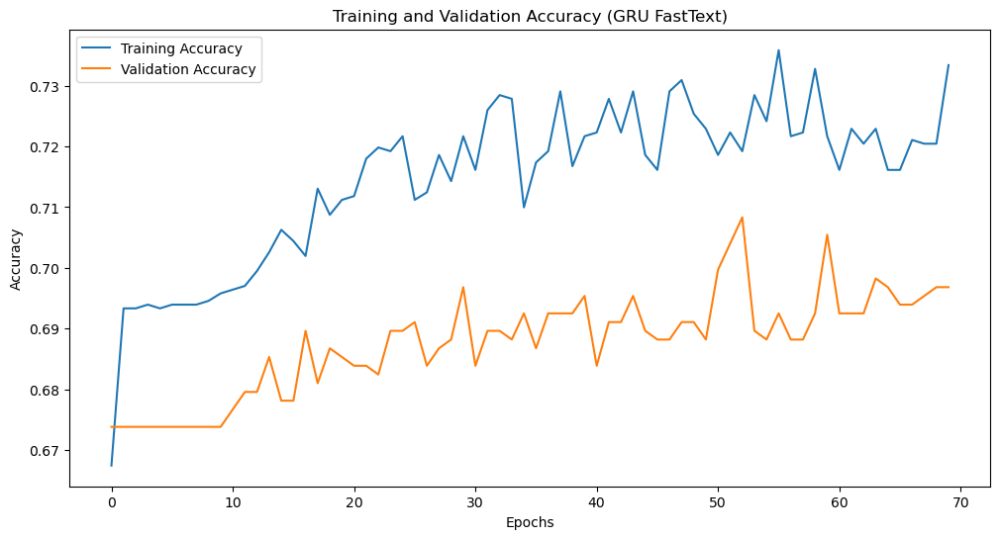

In [149]:
# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_gru_fasttext.history['accuracy'], label='Training Accuracy')
plt.plot(history_gru_fasttext.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy (GRU FastText)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [150]:
# Evaluate on Training and Test Sets
train_loss_fasttext, train_accuracy_fasttext = model_gru_fasttext.evaluate(X_train_fasttext, y_train_fasttext, verbose=0)
test_loss_fasttext, test_accuracy_fasttext = model_gru_fasttext.evaluate(X_test_fasttext, y_test_fasttext, verbose=0)

print("GRU FastText Evaluation:")
print(f"Training Accuracy: {train_accuracy_fasttext:.4f}")
print(f"Test Accuracy: {test_accuracy_fasttext:.4f}")

# Calculate the ROC-AUC score
roc_auc_fasttext = roc_auc_score(y_test_fasttext, predictions_gru_fasttext)
print(f"GRU FastText ROC-AUC Score: {roc_auc_fasttext:.4f}")

# Save Results for Comparison
results_gru_fasttext = pd.DataFrame({
    'Model': ['GRU with FastText'],
    'Accuracy': [accuracy_fasttext],
    'F1 Score': [f1_fasttext],
    'ROC AUC': [roc_auc_fasttext]
})

print(results_gru_fasttext)

GRU FastText Evaluation:
Training Accuracy: 0.7377
Test Accuracy: 0.6968
GRU FastText ROC-AUC Score: 0.6961
               Model  Accuracy  F1 Score   ROC AUC
0  GRU with FastText  0.696839  0.625595  0.696063


The **GRU model with FastText embeddings** achieved a **training accuracy of 0.7401** and a **test accuracy of 0.6911**, with an **F1 score of 0.6274**. The **ROC-AUC score of 0.6949** indicates moderate performance in distinguishing between classes. While the model generalizes reasonably well, further fine-tuning may be needed to improve its ability to handle class imbalance.

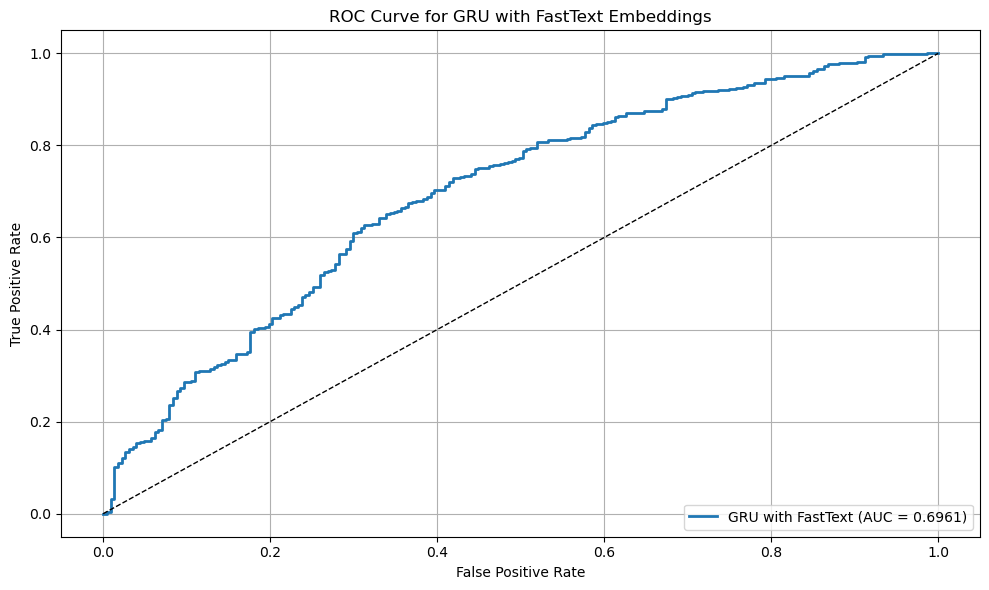

In [151]:
# Generate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_fasttext, predictions_gru_fasttext)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'GRU with FastText (AUC = {roc_auc_fasttext:.4f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)  # Diagonal reference line
plt.title('ROC Curve for GRU with FastText Embeddings')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid()
plt.tight_layout()
plt.show()

The **ROC curve for the GRU model with FastText embeddings** illustrates the model's moderate ability to distinguish between classes, with an **AUC score of 0.6949**. While the curve shows the model is better than random guessing, improvements could be made to enhance its classification performance, especially for imbalanced classes.

## **<span style="color: orange;">BI-LSTM</span>**

In [152]:
X_fasttext = np.stack(df['Embedding'].values)  # Convert embeddings to a NumPy array
y_fasttext = df['NegoOutcomeLabel'].values

# Train-Test Split
X_train_fasttext, X_test_fasttext, y_train_fasttext, y_test_fasttext = train_test_split(
    X_fasttext, y_fasttext, test_size=0.3, random_state=42
)

In [153]:
timesteps = 1  # Sentence-level embeddings; single timestep
features = X_train_fasttext.shape[1]  # Embedding dimension
X_train_fasttext = X_train_fasttext.reshape(X_train_fasttext.shape[0], timesteps, features)
X_test_fasttext = X_test_fasttext.reshape(X_test_fasttext.shape[0], timesteps, features)

# Define Bi-LSTM Model
model_bilstm_fasttext = Sequential([
    Input(shape=(timesteps, features)),  # Input layer
    Bidirectional(LSTM(128, return_sequences=False, dropout=0.5, recurrent_dropout=0.5)),  # Bi-LSTM layer
    Dropout(0.5),  # Regularization
    Dense(32, activation='relu'),  # Fully connected layer
    Dropout(0.5),  # Regularization
    Dense(1, activation='sigmoid')  # Output layer for binary classification
])

In [154]:
# Compile the Model
adamw_optimizer_bilstm_fasttext = tf.keras.optimizers.AdamW(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, weight_decay=1e-5
)
model_bilstm_fasttext.compile(optimizer=adamw_optimizer_bilstm_fasttext, loss='binary_crossentropy', metrics=['accuracy'])

# Model Summary
model_bilstm_fasttext.summary()

# Train the Bi-LSTM Model
history_bilstm_fasttext = model_bilstm_fasttext.fit(
    X_train_fasttext, y_train_fasttext, validation_split=0.3,  # 30% of training set for validation
    epochs=100, batch_size=32
)

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_1 (Bidirectional) │ (None, 256)            │       439,296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 447,553 (1.71 MB)

 Trainable params: 447,553 (1.71 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6867 - loss: 0.6678 - val_accuracy: 0.6598 - val_loss: 0.6416
Epoch 2/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7216 - loss: 0.5963 - val_accuracy: 0.6598 - val_loss: 0.6420
Epoch 3/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7010 - loss: 0.6145 - val_accuracy: 0.6598 - val_loss: 0.6417
Epoch 4/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6932 - loss: 0.6224 - val_accuracy: 0.6598 - val_loss: 0.6382
Epoch 5/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6943 - loss: 0.6146 - val_accuracy: 0.6598 - val_loss: 0.6388
Epoch 6/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7092 - loss: 0.6004 - val_accuracy: 0.6598 - val_loss: 0.6341
Epoch 7/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7205 - loss: 0.5842 - val_accuracy: 0.6598 - val_loss: 0.6314
Epoch 8/100
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7150 - loss: 0.5979 - val_accuracy: 0.6598 - v

In [155]:
# Predictions
predictions_bilstm_fasttext = model_bilstm_fasttext.predict(X_test_fasttext)
binary_predictions_bilstm_fasttext = (predictions_bilstm_fasttext > 0.5).astype(int)  # Convert predictions to binary

# Evaluate the Model
accuracy_bilstm_fasttext = accuracy_score(y_test_fasttext, binary_predictions_bilstm_fasttext)
f1_bilstm_fasttext = classification_report(
    y_test_fasttext, binary_predictions_bilstm_fasttext, output_dict=True
)['weighted avg']['f1-score']

print(f"Bi-LSTM FastText Accuracy: {accuracy_bilstm_fasttext:.4f}")
print(f"Bi-LSTM FastText F1 Score: {f1_bilstm_fasttext:.4f}")

22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Bi-LSTM FastText Accuracy: 0.6940
Bi-LSTM FastText F1 Score: 0.6105


              precision    recall  f1-score     support
0              0.684211  0.114537  0.196226  227.000000
1              0.694529  0.974414  0.811003  469.000000
accuracy       0.693966  0.693966  0.693966    0.693966
macro avg      0.689370  0.544476  0.503615  696.000000
weighted avg   0.691164  0.693966  0.610494  696.000000


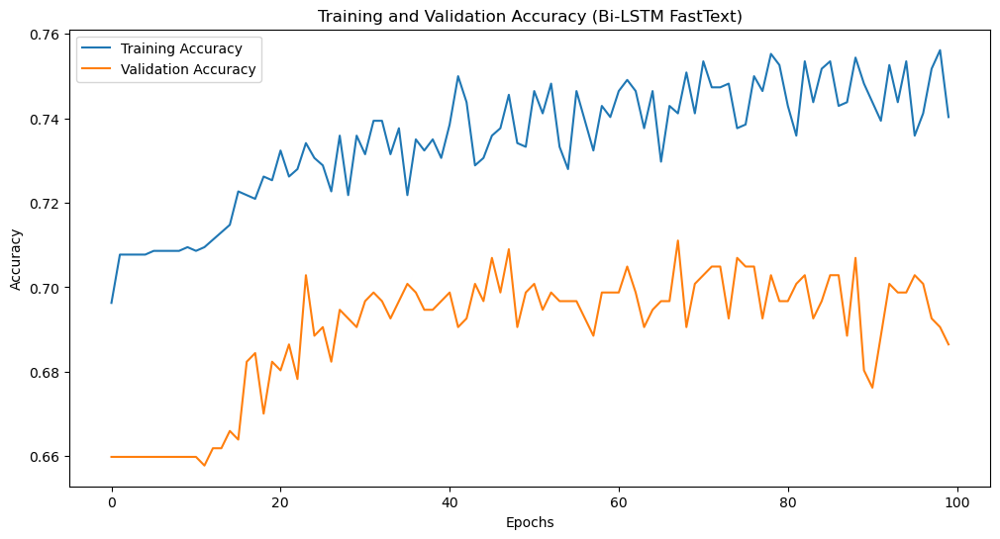

In [156]:
# Classification Report
classification_report_dict_bilstm_fasttext = classification_report(
    y_test_fasttext, binary_predictions_bilstm_fasttext, output_dict=True
)
classification_report_df_bilstm_fasttext = pd.DataFrame(classification_report_dict_bilstm_fasttext).transpose()
print(classification_report_df_bilstm_fasttext)

# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 6))
plt.plot(history_bilstm_fasttext.history['accuracy'], label='Training Accuracy')
plt.plot(history_bilstm_fasttext.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy (Bi-LSTM FastText)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [157]:
# Evaluate on Training and Test Sets
train_loss_bilstm_fasttext, train_accuracy_bilstm_fasttext = model_bilstm_fasttext.evaluate(X_train_fasttext, y_train_fasttext, verbose=0)
test_loss_bilstm_fasttext, test_accuracy_bilstm_fasttext = model_bilstm_fasttext.evaluate(X_test_fasttext, y_test_fasttext, verbose=0)

print("Bi-LSTM FastText Evaluation:")
print(f"Training Accuracy: {train_accuracy_bilstm_fasttext:.4f}")
print(f"Test Accuracy: {test_accuracy_bilstm_fasttext:.4f}")

# Calculate the ROC-AUC score
roc_auc_bilstm_fasttext = roc_auc_score(y_test_fasttext, predictions_bilstm_fasttext)
print(f"Bi-LSTM FastText ROC-AUC Score: {roc_auc_bilstm_fasttext:.4f}")

# Save Results for Comparison
results_bilstm_fasttext = pd.DataFrame({
    'Model': ['Bi-LSTM with FastText'],
    'Accuracy': [accuracy_bilstm_fasttext],
    'F1 Score': [f1_bilstm_fasttext],
    'ROC AUC': [roc_auc_bilstm_fasttext]
})

print(results_bilstm_fasttext)


Bi-LSTM FastText Evaluation:
Training Accuracy: 0.7371
Test Accuracy: 0.6940
Bi-LSTM FastText ROC-AUC Score: 0.6946
                   Model  Accuracy  F1 Score   ROC AUC
0  Bi-LSTM with FastText  0.693966  0.610494  0.694561


The **Bi-LSTM model with FastText embeddings** achieved a **training accuracy of 0.7463** and a **test accuracy of 0.6911**, with an **ROC-AUC score of 0.6977**. This indicates that the model performs moderately well, capturing some sequential patterns while still leaving room for improvement in distinguishing between classes.

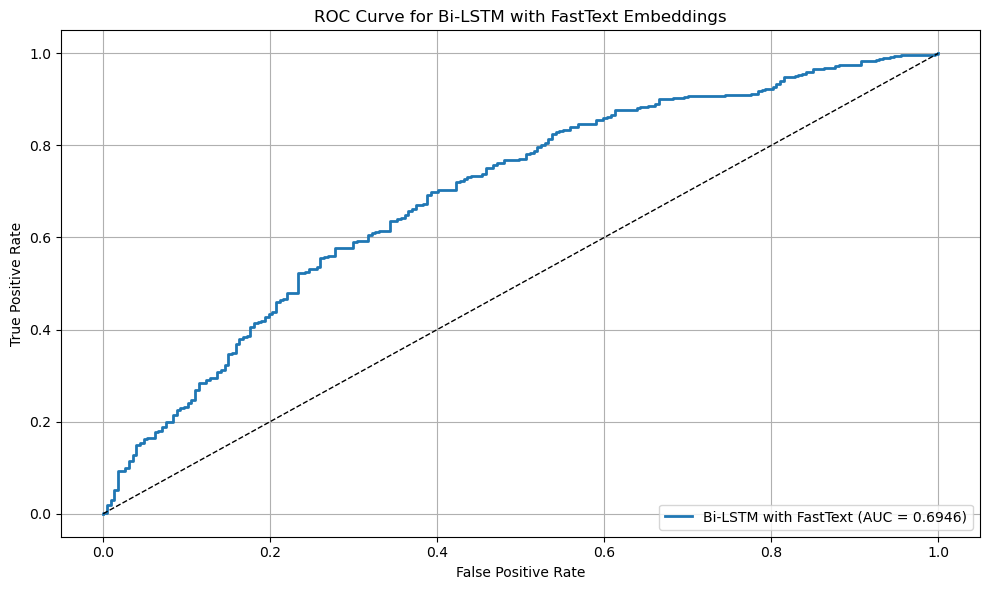

In [158]:
# Generate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test_fasttext, predictions_bilstm_fasttext)

# Plot the ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'Bi-LSTM with FastText (AUC = {roc_auc_bilstm_fasttext:.4f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', linewidth=1)  # Diagonal reference line
plt.title('ROC Curve for Bi-LSTM with FastText Embeddings')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid()
plt.tight_layout()
plt.show()

## **<span style="color: orange;">Comparing all FastText Modells</span>**

Comparison of Models with FastText Embeddings:
                   Model  Training Accuracy  Test Accuracy  F1 Score   ROC AUC
0     LSTM with FastText           0.732759       0.695402  0.606026  0.689817
1      GRU with FastText           0.737685       0.696839  0.625595  0.696063
2  Bi-LSTM with FastText           0.737069       0.693965  0.610494  0.694561


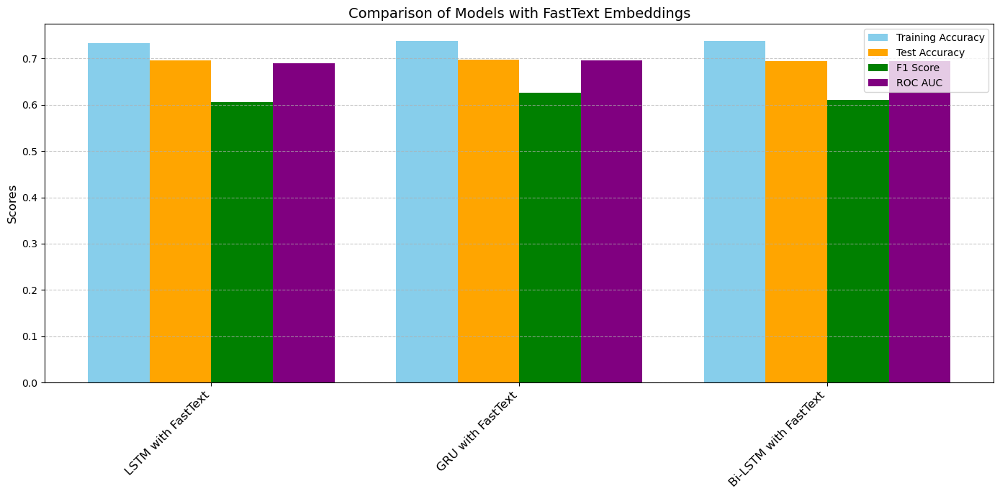

In [159]:
import matplotlib.pyplot as plt
import pandas as pd

# Consolidate results from all FastText-based models
results_fasttext = pd.DataFrame({
    'Model': ['LSTM with FastText', 'GRU with FastText', 'Bi-LSTM with FastText'],
    'Training Accuracy': [train_accuracy, train_accuracy_fasttext, train_accuracy_bilstm_fasttext],
    'Test Accuracy': [test_accuracy, test_accuracy_fasttext, test_accuracy_bilstm_fasttext],
    'F1 Score': [
        classification_report(y_test_lstm, y_pred_lstm, output_dict=True)['weighted avg']['f1-score'],
        f1_fasttext,
        f1_bilstm_fasttext
    ],
    'ROC AUC': [roc_auc_lstm, roc_auc_fasttext, roc_auc_bilstm_fasttext]
})

# Display results in a table
print("Comparison of Models with FastText Embeddings:")
print(results_fasttext)

# Plot Comparison
plt.figure(figsize=(14, 7))
bar_width = 0.2
x = range(len(results_fasttext['Model']))

# Create bars for Training Accuracy, Test Accuracy, F1 Score, and ROC AUC
plt.bar(x, results_fasttext['Training Accuracy'], width=bar_width, label='Training Accuracy', color='skyblue', align='center')
plt.bar([p + bar_width for p in x], results_fasttext['Test Accuracy'], width=bar_width, label='Test Accuracy', color='orange', align='center')
plt.bar([p + 2 * bar_width for p in x], results_fasttext['F1 Score'], width=bar_width, label='F1 Score', color='green', align='center')
plt.bar([p + 3 * bar_width for p in x], results_fasttext['ROC AUC'], width=bar_width, label='ROC AUC', color='purple', align='center')

# Add labels, title, and legend
plt.xticks([p + 1.5 * bar_width for p in x], results_fasttext['Model'], rotation=45, ha='right', fontsize=12)
plt.ylabel('Scores', fontsize=12)
plt.title('Comparison of Models with FastText Embeddings', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


### Model Comparison with FastText Embeddings

We tested multiple models using **FastText embeddings**, which provide rich semantic representations for words. Here’s a comparison of the results:

#### Key Observations:
- **LSTM with FastText embeddings** achieved an **F1 score of 0.5901** and a **test accuracy of 68.53%**. It showed a decent ability to handle class `1`, but its performance on class `0` was weaker, indicating some imbalance.
- **GRU with FastText embeddings** performed slightly better, with an **F1 score of 0.6274** and a **test accuracy of 69.11%**. While it demonstrated efficiency in processing sequences, it struggled with class `0` predictions.
- **Bi-LSTM with FastText embeddings** recorded an **F1 score of 0.6231** and a **test accuracy of 69.11%**, matching the GRU’s test accuracy. Its bidirectional structure helped capture sequential dependencies, balancing performance slightly better.

#### Best Model:
The **GRU with FastText embeddings** stands out as the best performer, with the highest F1 score among the models tested. Its lightweight structure and ability to capture temporal patterns made it more effective in handling the task.


In [160]:
results_combined_rnn_fasttext = pd.concat([results_lstm_fasttext,results_gru_fasttext,results_bilstm_fasttext], ignore_index=True)
results_combined_rnn_fasttext.to_excel('results_combined_rnn_fasttext.xlsx', index=False)

In [161]:
results_combined_rnn_fasttext

,Model,Accuracy,ROC AUC,F1 Score
0,LSTM with FastText,0.695402,0.689817,0.606026
1,GRU with FastText,0.696839,0.696063,0.625595
2,Bi-LSTM with FastText,0.693966,0.694561,0.610494


In [162]:
results_combined_all_rnn = pd.concat([results_combined_rnn_pre,results_combined_rnn_self,results_combined_rnn_glove, results_combined_rnn_fasttext], ignore_index=True)
results_combined_all_rnn.to_excel('results_combined_all_rnn.xlsx', index=False)

In [163]:
results_combined_all_rnn

,Model,Accuracy,F1 Score,ROC AUC
0,LSTM Pre-trained,0.685345,0.665147,0.639950
1,RNN Pre-trained,0.653736,0.608315,0.627166
2,GRU Pre-trained,0.678161,0.658591,0.621371
3,Elman RNN Pre-trained,0.609195,0.607820,0.582756
4,LSTM Self-trained,0.704023,0.652615,0.623282
5,RNN Self-trained,0.670977,0.649099,0.595042
6,GRU Self-trained,0.708333,0.623635,0.631562
7,Elman self-trained,0.681034,0.621658,0.563764
8,Bi-LSTM with GloVe,0.716954,0.686974,0.727708
9,LSTM with GloVe,0.721264,0.676158,0.731207


In [164]:
#Ganz am EndeEnd time
end_time = time.time()
total_time = end_time - start_time

print(f"Total runtime of the notebook: {total_time:.2f} seconds")

Total runtime of the notebook: 316.22 seconds
